# Pytorch Tutorial 4

In [14]:
import torch

# Debug output
print(torch.__version__)
print(torch.version.cuda)
print(torch.cuda.is_available())
torch.cuda.empty_cache()

2.6.0+cu124
12.4
True


In [34]:
!nvidia-smi

Tue Jul 15 20:57:08 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 560.28.03              Driver Version: 560.28.03      CUDA Version: 12.6     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA A30                     Off |   00000000:06:00.0 Off |                    0 |
| N/A   36C    P0             33W /  165W |   22845MiB /  24576MiB |      0%      Default |
|                                         |                        |             Disabled |
+-----------------------------------------+-----

In [16]:
# Imports
from torch import nn
import torch.nn as nn
from matplotlib import pyplot as plt
from torch.utils.data import Dataset, DataLoader
import os
import SimpleITK as sitk
import numpy as np
import torch.nn.functional as F

## 1. Datensatz




1) Implementiert zunächst eine Pytorch-Datensatzklasse für den [BraTS-Datensatz](http://braintumorsegmentation.org/). Diese bestehen jeweils aus 4 Gehirnschnitten (Flair, T1, T1_ce (Kontrastmittel), T2) und der dazugehörigen Segmentierung. Die Segmentierung ist ein Labelbild mit 3 Klassen. (Klasse 0: Hintergrund, Klasse 1: Tumor, Klasse 2: Ödem). Die Bilder sind unter `/home/shared/data` auffindbar.

In [4]:
# imports for MONAI
from monai.transforms import (
    RandGaussianNoised, 
    Compose, 
    RandZoomd, 
    RandRotate90d, 
    CenterSpatialCropd, 
    SpatialPadd,
    RandFlipd,
)


In [5]:
"""this contains the MONAI transform pipeline for data augmentation and preprocessing"""

target_shape = (155, 128, 128)

train_transforms = Compose([
    RandFlipd(keys=["image", "label"], prob=0.5, spatial_axis=0),     # 3D flip
    RandRotate90d(keys=["image", "label"], prob=0.5, max_k=1),        # random 90° rotation
    RandGaussianNoised(keys=["image"], prob=0.2, std=0.01),           # gaussian noise
    RandZoomd(keys=["image", "label"], prob=0.3, min_zoom=0.9, max_zoom=1.1, mode="nearest"),  # random zoom

    # Ensure all inputs are padded or cropped to the same target size
    SpatialPadd(keys=["image", "label"], spatial_size=target_shape),
    CenterSpatialCropd(keys=["image", "label"], roi_size=target_shape),
])


In [6]:
"""This code contains functions for preprocessing MRI images and segmentations.
    - normalize_tensor: Normalizes each channel of a 4D tensor independently.
    - pad_to_size: Pads a 4D tensor with zeros to reach a specified target shape.
    - center_crop_to_size: Crops a 4D tensor to a specified target shape from the center."""

def normalize_tensor(x):
    """
    Normalizes each channel (modality) of a 4D tensor (C, D, H, W) independently.
    The values are scaled to have zero mean and unit variance per channel.
    """
    for i in range(x.shape[0]):
        mean = x[i].mean() # calculate mean of current channel
        std = x[i].std() #calculate standard deviation of current channel
        x[i] = (x[i] - mean) / (std + 1e-8) # avoid division by zero
    return x

def pad_to_size(tensor, target_shape):
    """
    Pads a 4D tensor (C, D, H, W) with zeros to reach the specified target shape.

    Args:
        tensor: Input tensor
        target_shape: Desired shape as (D, H, W)

    Returns:
        Zero-padded tensor of shape at least target_shape
    """
    _, D, H, W = tensor.shape
    target_D, target_H, target_W = target_shape

    # Calculate required padding in each dimension
    pad_D = max(target_D - D, 0)
    pad_H = max(target_H - H, 0)
    pad_W = max(target_W - W, 0)

    padding = [
        pad_W // 2, pad_W - pad_W // 2,
        pad_H // 2, pad_H - pad_H // 2,
        pad_D // 2, pad_D - pad_D // 2
    ]
    return F.pad(tensor, padding, mode="constant", value=0) # Zero-padding

def center_crop_to_size(tensor, target_shape):
    """
    Performs a center crop of a 4D tensor (C, D, H, W) to the target shape.

    Args:
        tensor: Input tensor
        target_shape: Desired shape as (D, H, W)

    Returns:
        Cropped tensor of shape (C, target_D, target_H, target_W)
    """
    _, D, H, W = tensor.shape
    target_D, target_H, target_W = target_shape

    # Compute starting indices for cropping
    start_D = max((D - target_D) // 2, 0)
    start_H = max((H - target_H) // 2, 0)
    start_W = max((W - target_W) // 2, 0)

    # Compute end indices
    end_D = start_D + target_D
    end_H = start_H + target_H
    end_W = start_W + target_W

    return tensor[:, start_D:end_D, start_H:end_H, start_W:end_W]

In [7]:
"""BraTSDataset defines the dataset class for loading BraTS training data."""

DATADIR = "/home/shared/data/BraTS-torch-images-train/"

# list all subject IDs in the data directory and sort them numerically 
subject_IDs = os.listdir(DATADIR)
subject_IDs.sort(key=lambda x: int(x[len('BraTS20_Training_'):]))

class BRATSDataset(Dataset):
    """Dataset class for loading BraTS training data.
    
    Args:
        list: List of subject IDs (each corresponds to a subfolder with .nii.gz files)
        train: Boolean, True for training mode (with augmentation), False otherwise
        augment: MONAI transform pipeline to apply (only if train=True)
    """
    def __init__(self, list, train=True, augment=None):
        super(BRATSDataset, self).__init__()

        self.list = list # list of subject IDs
        self.train = train
        self.sequences = ("flair", "t1", "t2", "t1ce", "label") 
        self.augment = augment

        self.data = [] 

        for subject_id in self.list:
            images = {}
            for seq in self.sequences:
                filename = os.path.join(DATADIR, subject_id, f"{subject_id}_{seq}.nii.gz") 
                # Image files: Float32 for images, UInt8 for labels
                images[seq] = filename

            # Save all modality paths for one subject in a dictionary
            eintrag = {
                "Sub_ID": subject_id,
                "flair": images["flair"],
                "t1": images["t1"],
                "t1ce": images["t1ce"],
                "t2": images["t2"],
                "label": images["label"]
            }
            self.data.append(eintrag)
        
        
    def __len__(self):
        """Return the number of subjects in the dataset"""
        return len(self.data)

    def __getitem__(self, idx):
        """Load and preprocess a single data sample from the BraTS dataset.

        This method loads the 4 MRI modalities (`flair`, `t1`, `t1ce`, `t2`) and the corresponding 
        segmentation label for the subject at index `idx`. The data is:
        - converted to PyTorch tensors,
        - normalized,
        - cropped around the foreground region in the label,
        - padded and/or center-cropped to a fixed target shape,
        - optionally augmented (if in training mode and `augment` is provided).

        Args:
            idx (int): Index of the subject in the dataset.

        Returns:
            subject_id (dict): Dictionary containing the subject ID under key `"subject_id"`.
            image_tensor (torch.FloatTensor): Tensor of shape (4, D, H, W), containing the normalized MRI modalities.
            label (torch.LongTensor): Tensor of shape (1, D, H, W), containing the segmentation mask.
        """
        entry2 = self.data[idx] # Get the file paths for subject `idx`

        entry = {}
        for seq in self.sequences:
            # Read each image using SimpleITK
            entry[seq] = sitk.ReadImage(entry2[seq], outputPixelType=sitk.sitkFloat32 if seq != "label" else sitk.sitkUInt8)

        # load each modality as a numpy array (shape: D, H, W)
        flair = sitk.GetArrayFromImage(entry["flair"])
        t1 = sitk.GetArrayFromImage(entry["t1"])
        t1ce = sitk.GetArrayFromImage(entry["t1ce"])
        t2 = sitk.GetArrayFromImage(entry["t2"])
        label = sitk.GetArrayFromImage(entry["label"])
        
        # convert label to a PyTorch tensor (shape: 1, D, H, W)
        label = torch.from_numpy(label).long().unsqueeze(0)

        # stack all image modalities into one tensor: (shape: 4, D, H, W)
        image_tupel = torch.stack([
            torch.from_numpy(flair),
            torch.from_numpy(t1),
            torch.from_numpy(t1ce),
            torch.from_numpy(t2)
        ], dim=0).float()  # ensure float32 type

        # normalize the image tensor 
        image_tupel = normalize_tensor(image_tupel)     

        # crop around forground region
        # 1. create binary mask where label > 0 
        foreground_mask = (label[0] > 0)
        
        # 2. get coordinates of nonzero region (bounding box)
        coords = foreground_mask.nonzero()
        z_min, y_min, x_min = coords.min(0).values
        z_max, y_max, x_max = coords.max(0).values
        
        # 3. add small padding to avoid cropping too close to the edge
        padding = 5
        z_min = max(z_min - padding, 0)
        y_min = max(y_min - padding, 0)
        x_min = max(x_min - padding, 0)
        
        z_max = min(z_max + padding, image_tupel.shape[1] - 1)
        y_max = min(y_max + padding, image_tupel.shape[2] - 1)
        x_max = min(x_max + padding, image_tupel.shape[3] - 1)
        
        # 4. crop only in y and x dimensions (preserve full depth)
        image_tupel = image_tupel[:, :, y_min:y_max+1, x_min:x_max+1]
        label = label[:, :, y_min:y_max+1, x_min:x_max+1]

        # target shape after cropping/padding
        target_shape = (155, 128, 128)

        # Pad if too small, crop if too large (to ensure consistent input size)
        image_tupel = pad_to_size(image_tupel, target_shape)
        label = pad_to_size(label, target_shape)
        
        image_tupel = center_crop_to_size(image_tupel, target_shape)
        label = center_crop_to_size(label, target_shape)
    
        # Apply augmentation (only during training)
        if self.train and self.augment:
            data_dict = {"image": image_tupel, "label": label}
            data_dict = self.augment(data_dict)
            image_tupel = data_dict["image"]
            label = data_dict["label"]
        
        # Return subject ID as dict + preprocessed image + label 
        subject_id = {'subject_id': entry2["Sub_ID"]}
        return subject_id, image_tupel, label

dataset = BRATSDataset(subject_IDs, train=True, augment=train_transforms)
print("Dataset geladen")

Dataset geladen


In [8]:
"""Debug output: load the first sample from the dataset"""

subject_id, image_tupel, label = dataset[0]

print(subject_id['subject_id'])
print(image_tupel.shape)          # (4, D, H, W)
print(label.shape)            # (1, D, H, W)

BraTS20_Training_001
torch.Size([4, 155, 128, 128])
torch.Size([1, 155, 128, 128])


2) Initialisiert den Trainingsdatensatz. Trennt dabei eine sinnvolle Menge an Daten ab, um einen Validierungsdatensatz zu erhalten, um den Fortschritt eures Trainings überwachen zu können.

In [9]:
"""Split the dataset into training and validation subsets"""

from sklearn.model_selection import train_test_split, KFold, StratifiedKFold

full_ds = dataset
train_data, val_data = train_test_split(subject_IDs,train_size=0.8 ,random_state=42)
train_ds = BRATSDataset(train_data, train=True, augment=train_transforms)
val_ds = BRATSDataset(val_data, train=False, augment=None)

3) Nun nutzt pyplot um euch einen Beispieldatensatz anzusehen.

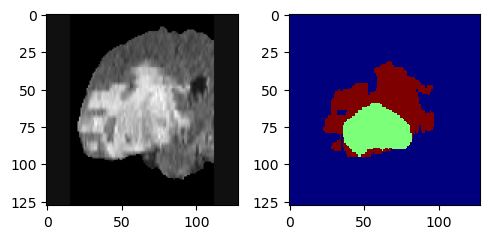

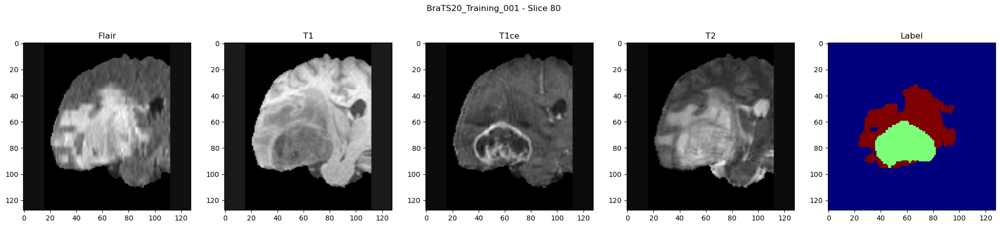

In [10]:
"""Example display of the data"""

# show one image slice
flair = image_tupel[0]  # 4 modalities: flair, t1, t1ce, t2
image_slice = flair[80]  # select Slice 80

label_slice = label[0]
label_slice_80 = label_slice[80]

# plot image and label 
fig, ax = plt.subplots(1, 2, figsize=(5, 5)) 
ax[0].imshow(image_slice, cmap='gray') # Flair image
ax[1].imshow(label_slice_80, cmap='jet', interpolation='none') # Label 
plt.tight_layout()
plt.show()

## display all modalities and label for a given slice index
slice_idx = 80 
sequences = ['Flair', 'T1', 'T1ce', 'T2', 'Label']

fig, axs = plt.subplots(1, 5, figsize=(25, 5))

for i in range(4):
    slice_img = image_tupel[i, slice_idx, :, :].numpy()
    axs[i].imshow(slice_img, cmap='gray')
    axs[i].set_title(sequences[i])

# show the label 
label_slice = label[0,slice_idx, :, :].numpy()
axs[4].imshow(label_slice, cmap='jet', interpolation='none')
axs[4].set_title('Label')

plt.suptitle(f"{subject_id['subject_id']} - Slice {slice_idx}")
plt.show()

In [11]:
# Dataset split - Debug output
print('Dataset: {} images'.format(len(full_ds)))
print('Training Dataset: {} images'.format(len(train_ds)))
print('Validation Dataset: {} images'.format(len(val_ds)))


Dataset: 259 images
Training Dataset: 207 images
Validation Dataset: 52 images


## 2. Modell
Nachdem wir einen Überblick über die Daten gewonnen haben erstellen wir das Modell. Erstellt zunächst das Modell aus der Vorgabe. Dieses ist recht einfach, aber ihr könnt es im Anschluss sukzessive verbessern und damit herum experimentieren. 
Das Netz soll eine pixelweise Klassifikation vornehmen, also jedem Pixel eines der Labels (Klasse 0: Hintergrund, Klasse 1: Tumor, Klasse 2: Ödem) zuordnen.

__Tipp:__ bei komplexeren Netzen können die Definition und insbesondere die *forward*-Methode unübersichtlich werden. Um dem entgegen zu wirken, können Module in der Definition des Netzes mit 
[nn.Sequential()](https://pytorch.org/docs/stable/generated/torch.nn.Sequential.html) zusammengefasst werden.

1) Implementiert das folgende Netz.

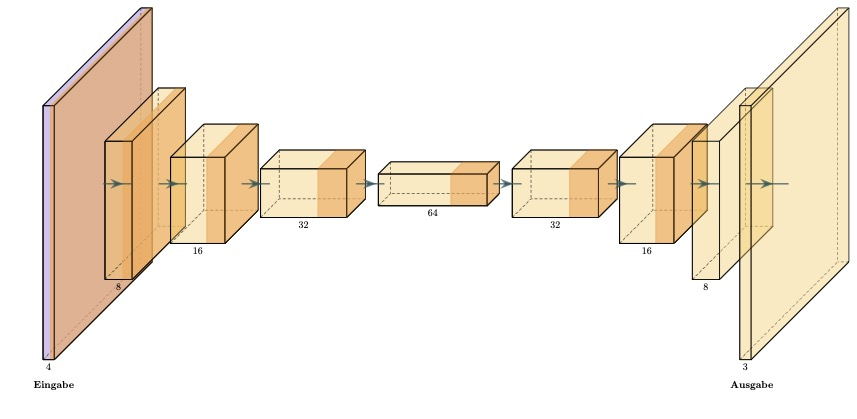

Dabei stehen die gelben Boxen für Feature-Maps, die durch eine Convolutional-Layer entstanden sind. Haben sie außerdem eine orangefarbene Bande an der rechten Seite wird bei der nachfolgenden Convolution (Pfeil) eine ReLU als Aktivierungsfunktion verwendet.
Die Zahlen an der unteren Seite bezeichnen die Größe der Channeldimension. Nutzt außerdem [Average Pooling](https://pytorch.org/docs/stable/generated/torch.nn.AvgPool2d.html) und [Upsampling](https://pytorch.org/docs/stable/generated/torch.nn.Upsample.html) um die Bildgrößen von Schicht zu Schicht zu halbieren, bzw. zu verdoppeln.

In [12]:
""" This contains the architecture for the 3D U-Net model"""

kern_sz = 3
padding = 1

class BRATSSegNet(nn.Module):
    def __init__(self, in_channels, num_classes):
        """
        Initializes the 3D U-Net model with specified input channels and output classes.

        Args:
            in_channels (int): Number of input channels (4 for MRI modalities).
            num_classes (int): Number of segmentation output classes.

        Returns:
            None
        """
        super().__init__()
        self.num_classes = num_classes

        # Encoder layers
        self.enc1 = self.conv_block(in_channels, out_channels=8)
        self.pool1 = nn.AvgPool3d(kernel_size=3,stride=2, padding=1)

        self.enc2 = self.conv_block(in_channels=8, out_channels=16)
        self.pool2 = nn.AvgPool3d(kernel_size=3,stride=2, padding=1)

        self.enc3 = self.conv_block(in_channels=16, out_channels=32)
        self.pool3 = nn.AvgPool3d(kernel_size=3,stride=2, padding=1)

        self.enc4 = self.conv_block(in_channels=32, out_channels=64)
        self.pool4 = nn.AvgPool3d(kernel_size=3,stride=2, padding=1)

        self.enc5 = self.conv_block(in_channels=64, out_channels=128)
        self.pool5 = nn.AvgPool3d(kernel_size=3,stride=2, padding=1)

        self.bottleneck = self.conv_block(in_channels=128, out_channels=256)

        # Decoder layers 
        self.up4 = nn.ConvTranspose3d(in_channels=256, out_channels=128, kernel_size=2, stride=2)
        self.dec4 = self.conv_block(in_channels=256, out_channels=128)

        self.up3 = nn.ConvTranspose3d(in_channels=128, out_channels=64, kernel_size=2, stride=2)
        self.dec3 = self.conv_block(in_channels=128, out_channels=64)

        self.up2 = nn.ConvTranspose3d(in_channels=64, out_channels=32, kernel_size=2, stride=2)
        self.dec2 = self.conv_block(in_channels=64, out_channels=32)

        self.up1 = nn.ConvTranspose3d(in_channels=32, out_channels=16, kernel_size=2, stride=2)
        self.dec1 = self.conv_block(in_channels=32, out_channels=16)

        self.up0 = nn.ConvTranspose3d(in_channels=16, out_channels=8, kernel_size=2, stride=2)
        self.dec0 = self.conv_block(in_channels=16, out_channels=8)

        self.final_conv = nn.Conv3d(in_channels=8, out_channels=num_classes, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        """
        Creates a convolutional block consisting of two 3D convolution layers 
        with normalization and activation functions.

        Args:
            in_channels (int): Number of input feature channels.
            out_channels (int): Number of output feature channels.

        Returns:
            nn.Sequential: A sequential container of layers representing the conv block.
        """
        return nn.Sequential(
            nn.Conv3d(in_channels, out_channels, kernel_size=kern_sz, padding=padding),
            nn.InstanceNorm3d(out_channels),
            nn.LeakyReLU(inplace=True),      
            nn.Conv3d(out_channels, out_channels, kernel_size=kern_sz, padding=padding),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        """
        Defines the forward pass through the 3D U-Net architecture.

        Args:
            x (torch.Tensor): Input tensor of shape (batch_size, in_channels, D, H, W).

        Returns:
            torch.Tensor: Output tensor of shape (batch_size, num_classes, D, H, W),
                          representing segmentation logits.
        """
        e1 = self.enc1(x)
        p1 = self.pool1(e1)
    
        e2 = self.enc2(p1)
        p2 = self.pool2(e2)
    
        e3 = self.enc3(p2)
        p3 = self.pool3(e3)
    
        e4 = self.enc4(p3)
        p4 = self.pool4(e4)
    
        e5 = self.enc5(p4)
        p5 = self.pool5(e5)
    
        b = self.bottleneck(p5)
    
        # Decoder forward pass 
        d4 = self.crop_and_concat(self.up4(b), e5)
        d4 = self.dec4(d4)
    
        d3 = self.crop_and_concat(self.up3(d4), e4)
        d3 = self.dec3(d3)
    
        d2 = self.crop_and_concat(self.up2(d3), e3)
        d2 = self.dec2(d2)
    
        d1 = self.crop_and_concat(self.up1(d2), e2)
        d1 = self.dec1(d1)
    
        d0 = self.crop_and_concat(self.up0(d1), e1)
        d0 = self.dec0(d0)
    
        return self.final_conv(d0)
        
    def crop_and_concat(self, upsampled, bypass):
        """
        Pads the upsampled tensor if necessary so it matches the spatial dimensions
        of the bypass tensor, then concatenates them along the channel dimension.

        Args:
            upsampled (Tensor): The tensor resulting from the decoder upsampling, shape: (batch_size, channels, D, H, W)
            bypass (Tensor): The tensor from the corresponding encoder skip connection, shape: (batch_size, channels, D, H, W)

        Returns:
            torch.Tensor: Concatenated tensor of shape (batch_size, channels_combined, D, H, W), 
                            where channels_combined = channels_upsampled + channels_bypass
        """
        if upsampled.shape[2:] != bypass.shape[2:]:
            diffZ = bypass.size(2) - upsampled.size(2)
            diffY = bypass.size(3) - upsampled.size(3)
            diffX = bypass.size(4) - upsampled.size(4)

            # Pad the upsampled tensor accordingly
            upsampled = F.pad(upsampled, [
                diffX // 2, diffX - diffX // 2,
                diffY // 2, diffY - diffY // 2,
                diffZ // 2, diffZ - diffZ // 2
            ])

        # Concatenate along the channel dimension
        return torch.cat([upsampled, bypass], dim=1)

model = BRATSSegNet(in_channels=4, num_classes=3)

## 3. Training
Jetzt muss wieder der Traingsloop erstellt werden. Nehmt dazu zunächst die notwendigen Initialisierungen vor (Dataloader, Anzahl Epochen, Model, Optimizer, ...). Denkt dran, dass die Daten und das Modell, mit denen hier gearbeitet wird, deutlich größer sind als zuvor. Verschiebt daher das Netz vor dem Training und eure Batches während dessen auf die Grafikkarte ('cuda'). Andernfalls kann das Training sehr viel Zeit in Anspruch nehmen...

Training on: cuda:5


100%|██████████| 7/7 [00:28<00:00,  4.08s/it]

(4, 1, 155, 128, 128)


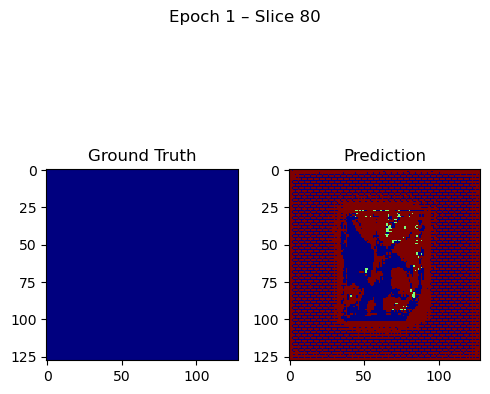

Model improved. Checkpoint saved at epoch 1
Epoch 1/100
 Train Loss: 0.8221
 Val Loss: 0.8031
 Val Dice Score (mean): 0.2099


100%|██████████| 7/7 [00:28<00:00,  4.02s/it]

(4, 1, 155, 128, 128)


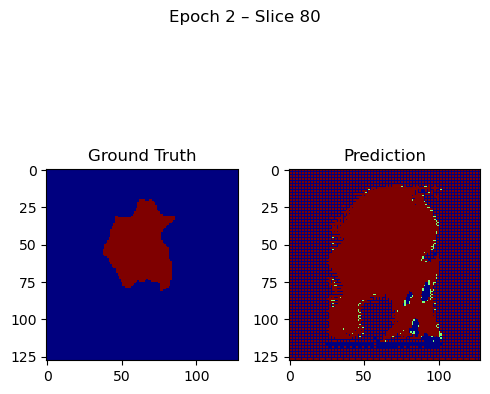

Model improved. Checkpoint saved at epoch 2
Epoch 2/100
 Train Loss: 0.7865
 Val Loss: 0.7662
 Val Dice Score (mean): 0.2882


100%|██████████| 7/7 [00:25<00:00,  3.60s/it]

(4, 1, 155, 128, 128)


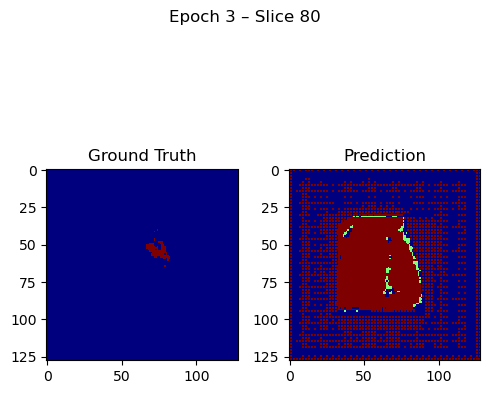

Model improved. Checkpoint saved at epoch 3
Epoch 3/100
 Train Loss: 0.7493
 Val Loss: 0.7313
 Val Dice Score (mean): 0.3722


100%|██████████| 7/7 [00:28<00:00,  4.04s/it]

(4, 1, 155, 128, 128)


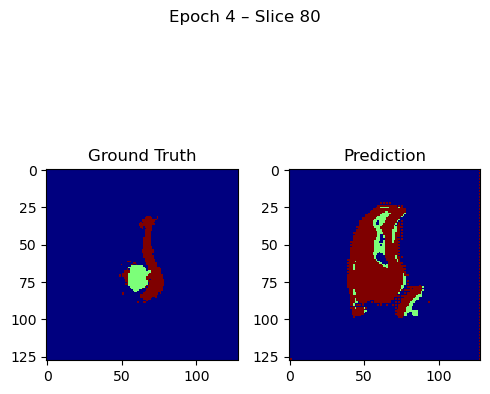

Model improved. Checkpoint saved at epoch 4
Epoch 4/100
 Train Loss: 0.7125
 Val Loss: 0.6933
 Val Dice Score (mean): 0.4622


100%|██████████| 7/7 [00:22<00:00,  3.20s/it]

(4, 1, 155, 128, 128)


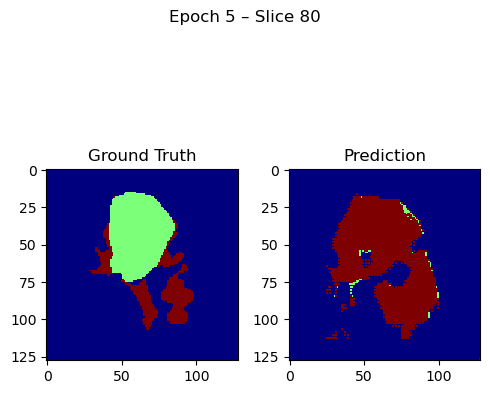

Model improved. Checkpoint saved at epoch 5
Epoch 5/100
 Train Loss: 0.6727
 Val Loss: 0.6522
 Val Dice Score (mean): 0.4905


100%|██████████| 7/7 [00:26<00:00,  3.76s/it]

(4, 1, 155, 128, 128)


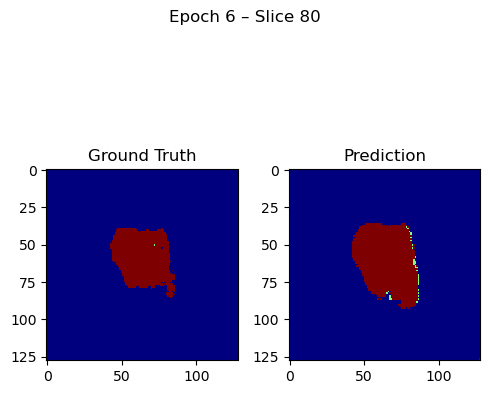

Model improved. Checkpoint saved at epoch 6
Epoch 6/100
 Train Loss: 0.6343
 Val Loss: 0.6157
 Val Dice Score (mean): 0.5157


100%|██████████| 7/7 [00:22<00:00,  3.18s/it]


(4, 1, 155, 128, 128)


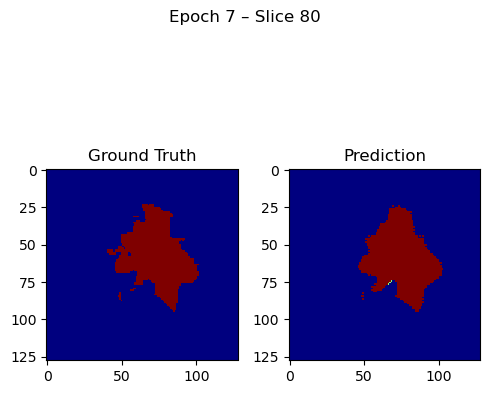

Model improved. Checkpoint saved at epoch 7
Epoch 7/100
 Train Loss: 0.5952
 Val Loss: 0.5721
 Val Dice Score (mean): 0.5239


100%|██████████| 7/7 [00:23<00:00,  3.40s/it]

(4, 1, 155, 128, 128)


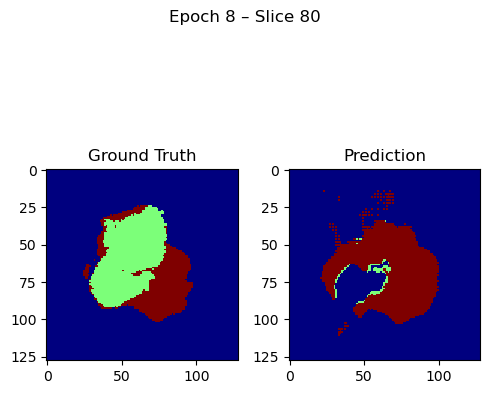

Model improved. Checkpoint saved at epoch 8
Epoch 8/100
 Train Loss: 0.5575
 Val Loss: 0.5341
 Val Dice Score (mean): 0.5582


100%|██████████| 7/7 [00:20<00:00,  2.95s/it]

(4, 1, 155, 128, 128)


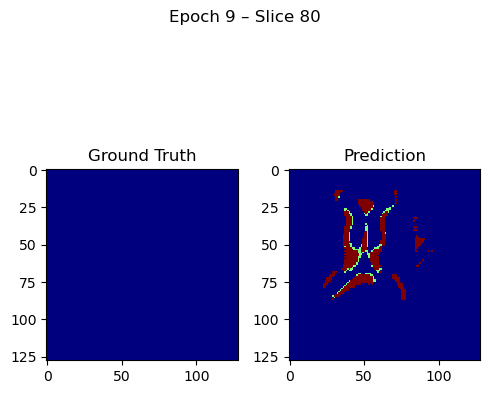

Model improved. Checkpoint saved at epoch 9
Epoch 9/100
 Train Loss: 0.5214
 Val Loss: 0.5053
 Val Dice Score (mean): 0.5809


100%|██████████| 7/7 [00:23<00:00,  3.36s/it]

(4, 1, 155, 128, 128)


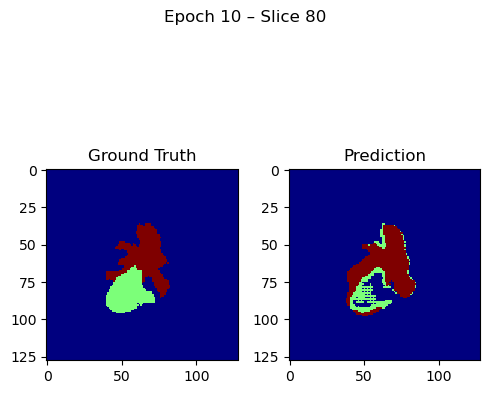

Model improved. Checkpoint saved at epoch 10
Epoch 10/100
 Train Loss: 0.4836
 Val Loss: 0.4604
 Val Dice Score (mean): 0.7229


100%|██████████| 7/7 [00:25<00:00,  3.64s/it]

(4, 1, 155, 128, 128)


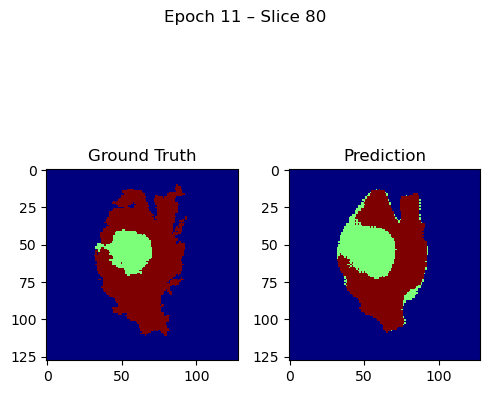

Model improved. Checkpoint saved at epoch 11
Epoch 11/100
 Train Loss: 0.4244
 Val Loss: 0.3981
 Val Dice Score (mean): 0.7493


100%|██████████| 7/7 [00:24<00:00,  3.47s/it]

(4, 1, 155, 128, 128)


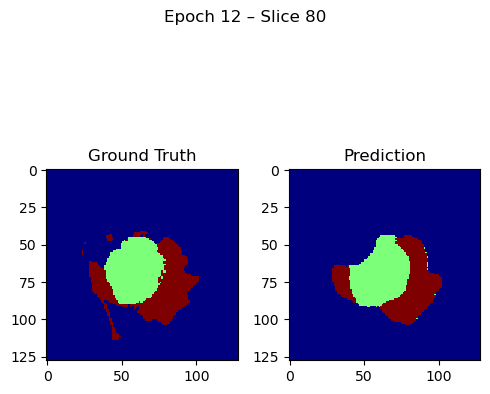

Model improved. Checkpoint saved at epoch 12
Epoch 12/100
 Train Loss: 0.3717
 Val Loss: 0.3563
 Val Dice Score (mean): 0.7408


100%|██████████| 7/7 [00:22<00:00,  3.26s/it]

(4, 1, 155, 128, 128)


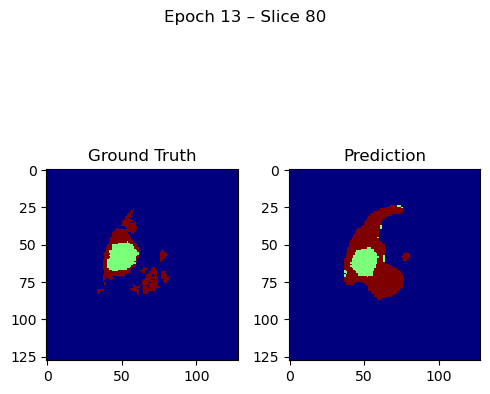

Model improved. Checkpoint saved at epoch 13
Epoch 13/100
 Train Loss: 0.3295
 Val Loss: 0.3244
 Val Dice Score (mean): 0.7601


100%|██████████| 7/7 [00:22<00:00,  3.19s/it]

(4, 1, 155, 128, 128)


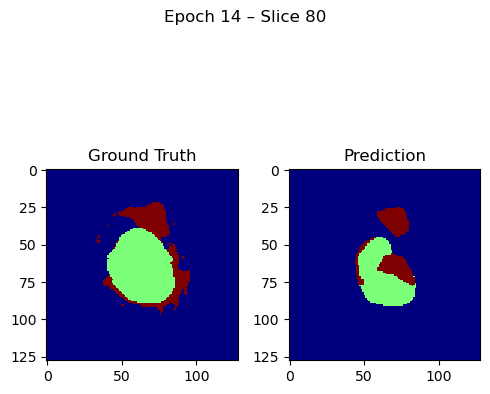

Model improved. Checkpoint saved at epoch 14
Epoch 14/100
 Train Loss: 0.3047
 Val Loss: 0.3054
 Val Dice Score (mean): 0.7728


100%|██████████| 7/7 [00:22<00:00,  3.21s/it]

(4, 1, 155, 128, 128)


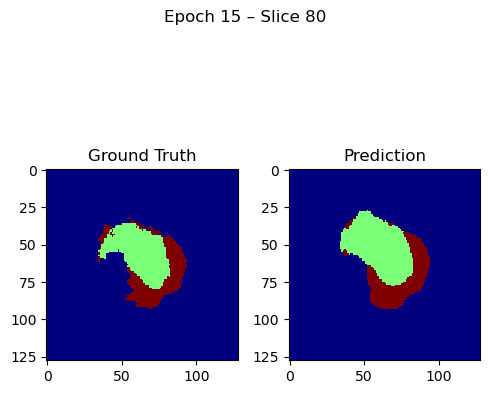

Model improved. Checkpoint saved at epoch 15
Epoch 15/100
 Train Loss: 0.2774
 Val Loss: 0.2855
 Val Dice Score (mean): 0.7712


100%|██████████| 7/7 [00:20<00:00,  2.98s/it]

(4, 1, 155, 128, 128)


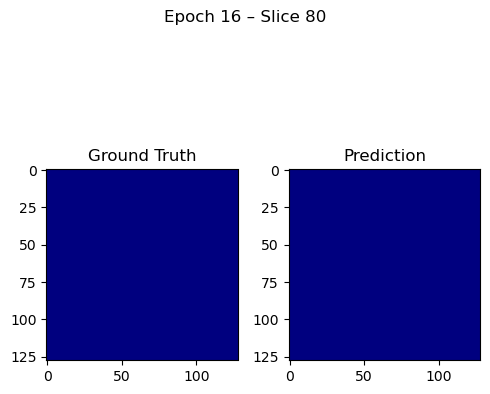

Model improved. Checkpoint saved at epoch 16
Epoch 16/100
 Train Loss: 0.2639
 Val Loss: 0.2725
 Val Dice Score (mean): 0.7861


100%|██████████| 7/7 [00:20<00:00,  2.99s/it]

(4, 1, 155, 128, 128)


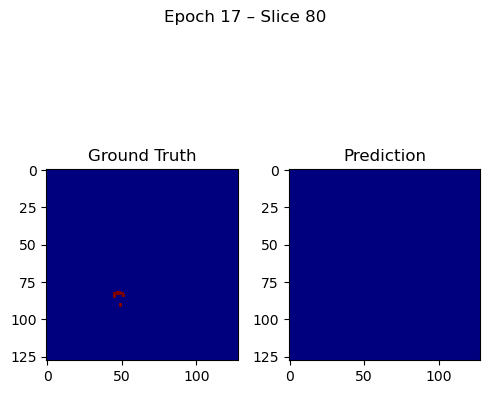

Model improved. Checkpoint saved at epoch 17
Epoch 17/100
 Train Loss: 0.2440
 Val Loss: 0.2578
 Val Dice Score (mean): 0.7936


100%|██████████| 7/7 [00:26<00:00,  3.72s/it]


(4, 1, 155, 128, 128)


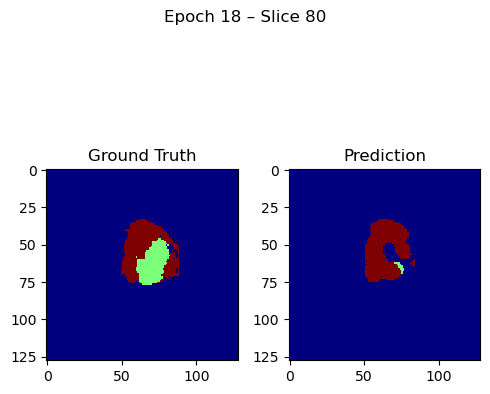

Model improved. Checkpoint saved at epoch 18
Epoch 18/100
 Train Loss: 0.2380
 Val Loss: 0.2409
 Val Dice Score (mean): 0.7948


100%|██████████| 7/7 [00:19<00:00,  2.80s/it]

(4, 1, 155, 128, 128)


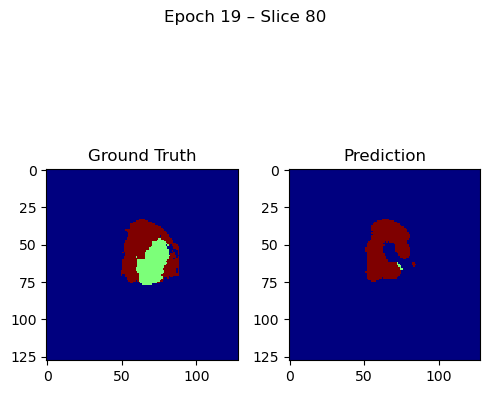

Model improved. Checkpoint saved at epoch 19
Epoch 19/100
 Train Loss: 0.2234
 Val Loss: 0.2357
 Val Dice Score (mean): 0.8007


100%|██████████| 7/7 [00:23<00:00,  3.37s/it]

(4, 1, 155, 128, 128)


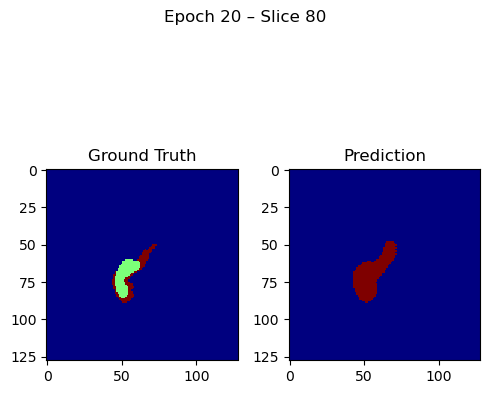

Epoch 20/100
 Train Loss: 0.2152
 Val Loss: 0.2373
 Val Dice Score (mean): 0.7920


100%|██████████| 7/7 [00:19<00:00,  2.81s/it]


(4, 1, 155, 128, 128)


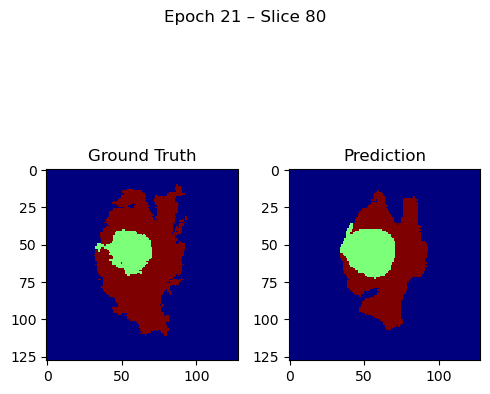

Model improved. Checkpoint saved at epoch 21
Epoch 21/100
 Train Loss: 0.2080
 Val Loss: 0.2246
 Val Dice Score (mean): 0.7986


100%|██████████| 7/7 [00:19<00:00,  2.80s/it]


(4, 1, 155, 128, 128)


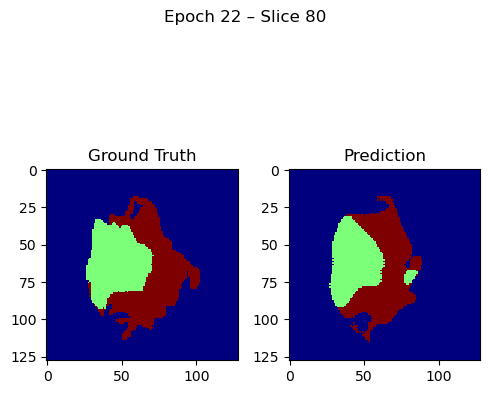

Model improved. Checkpoint saved at epoch 22
Epoch 22/100
 Train Loss: 0.2088
 Val Loss: 0.2210
 Val Dice Score (mean): 0.8049


100%|██████████| 7/7 [00:20<00:00,  2.90s/it]


(4, 1, 155, 128, 128)


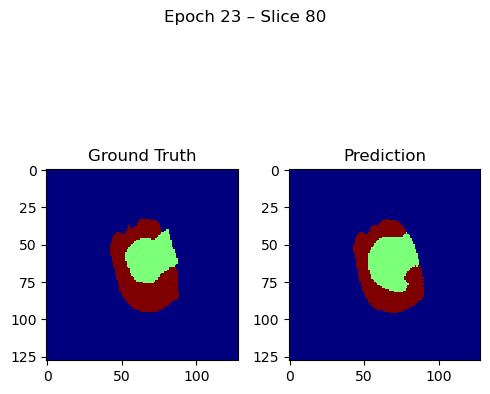

Model improved. Checkpoint saved at epoch 23
Epoch 23/100
 Train Loss: 0.1962
 Val Loss: 0.2036
 Val Dice Score (mean): 0.8164


100%|██████████| 7/7 [00:20<00:00,  2.92s/it]


(4, 1, 155, 128, 128)


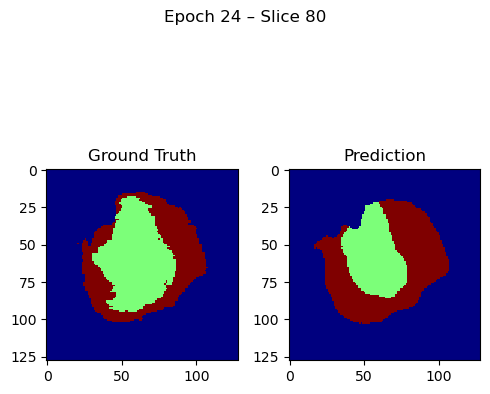

Epoch 24/100
 Train Loss: 0.1938
 Val Loss: 0.2064
 Val Dice Score (mean): 0.8119


100%|██████████| 7/7 [00:19<00:00,  2.72s/it]


(4, 1, 155, 128, 128)


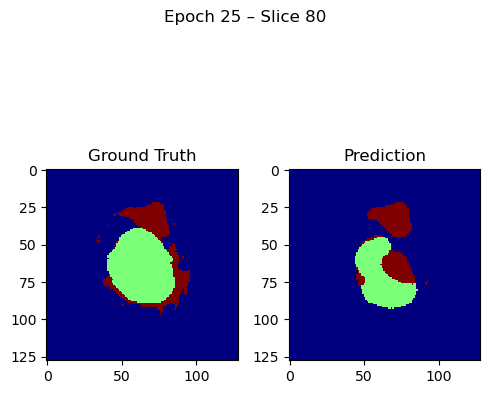

Epoch 25/100
 Train Loss: 0.1845
 Val Loss: 0.2048
 Val Dice Score (mean): 0.8174


100%|██████████| 7/7 [00:19<00:00,  2.75s/it]


(4, 1, 155, 128, 128)


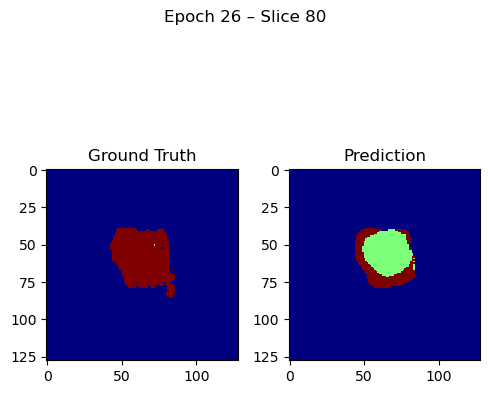

Epoch 26/100
 Train Loss: 0.1891
 Val Loss: 0.2115
 Val Dice Score (mean): 0.8049


100%|██████████| 7/7 [00:17<00:00,  2.54s/it]


(4, 1, 155, 128, 128)


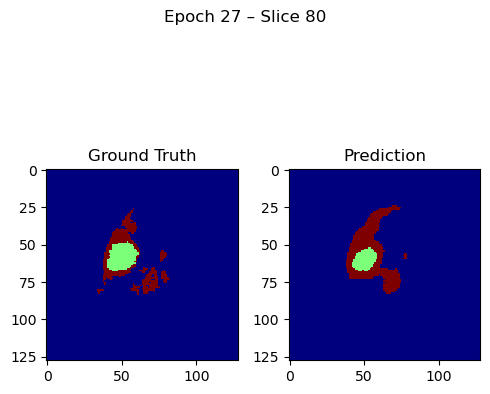

Epoch 27/100
 Train Loss: 0.1802
 Val Loss: 0.2128
 Val Dice Score (mean): 0.8090


100%|██████████| 7/7 [00:21<00:00,  3.05s/it]


(4, 1, 155, 128, 128)


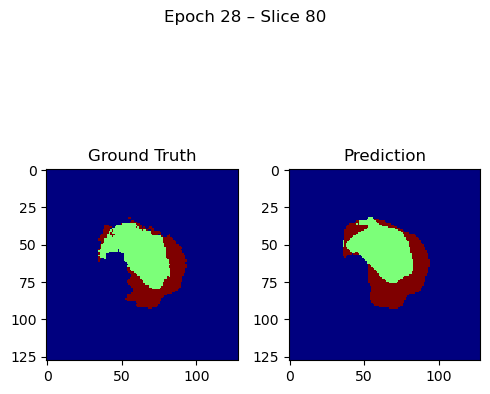

Model improved. Checkpoint saved at epoch 28
Epoch 28/100
 Train Loss: 0.1812
 Val Loss: 0.2012
 Val Dice Score (mean): 0.8148


100%|██████████| 7/7 [00:23<00:00,  3.35s/it]

(4, 1, 155, 128, 128)


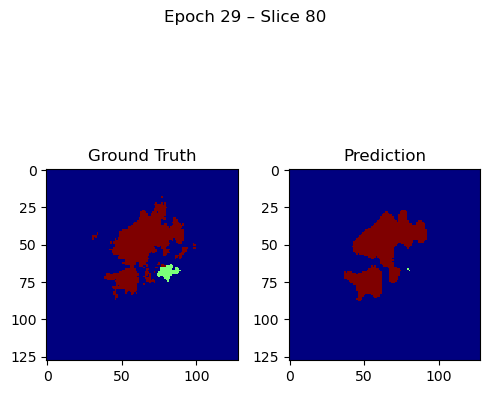

Epoch 29/100
 Train Loss: 0.1798
 Val Loss: 0.2020
 Val Dice Score (mean): 0.8117


100%|██████████| 7/7 [00:27<00:00,  3.88s/it]

(4, 1, 155, 128, 128)


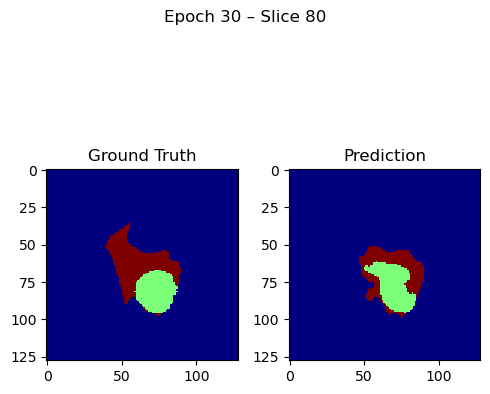

Epoch 30/100
 Train Loss: 0.1784
 Val Loss: 0.2013
 Val Dice Score (mean): 0.8133


100%|██████████| 7/7 [00:24<00:00,  3.57s/it]

(4, 1, 155, 128, 128)


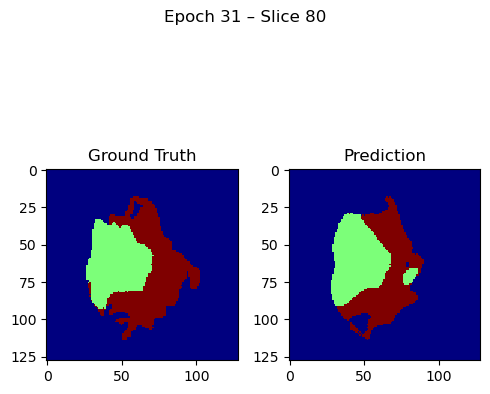

Epoch 31/100
 Train Loss: 0.1697
 Val Loss: 0.2032
 Val Dice Score (mean): 0.8145


100%|██████████| 7/7 [00:25<00:00,  3.63s/it]

(4, 1, 155, 128, 128)


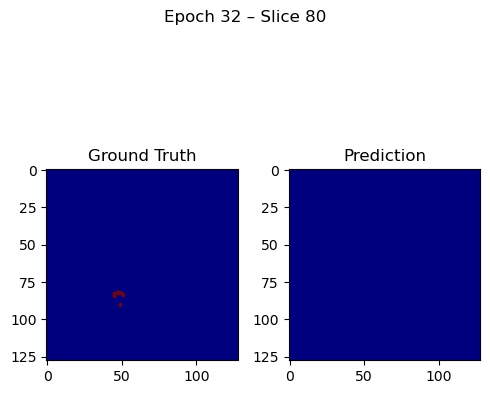

Model improved. Checkpoint saved at epoch 32
Epoch 32/100
 Train Loss: 0.1739
 Val Loss: 0.1923
 Val Dice Score (mean): 0.8153


100%|██████████| 7/7 [00:27<00:00,  3.92s/it]

(4, 1, 155, 128, 128)


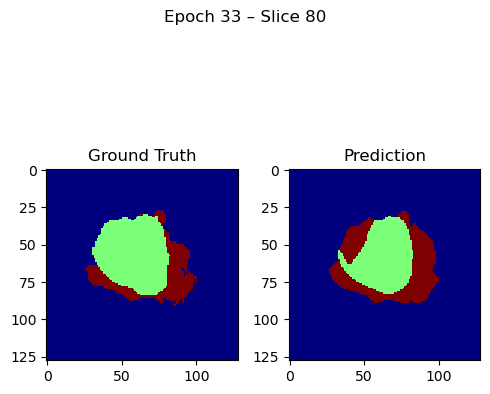

Epoch 33/100
 Train Loss: 0.1709
 Val Loss: 0.1997
 Val Dice Score (mean): 0.8053


100%|██████████| 7/7 [00:24<00:00,  3.46s/it]

(4, 1, 155, 128, 128)


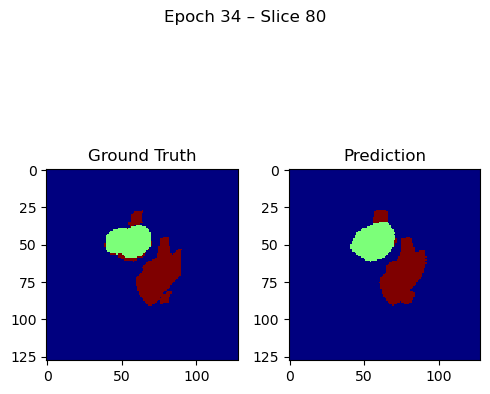

Model improved. Checkpoint saved at epoch 34
Epoch 34/100
 Train Loss: 0.1697
 Val Loss: 0.1875
 Val Dice Score (mean): 0.8170


100%|██████████| 7/7 [00:27<00:00,  3.86s/it]

(4, 1, 155, 128, 128)


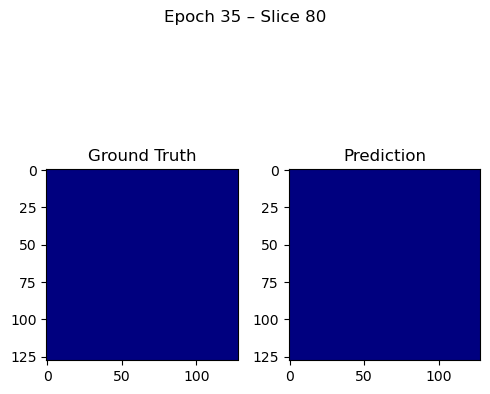

Epoch 35/100
 Train Loss: 0.1599
 Val Loss: 0.1891
 Val Dice Score (mean): 0.8209


100%|██████████| 7/7 [00:22<00:00,  3.20s/it]

(4, 1, 155, 128, 128)


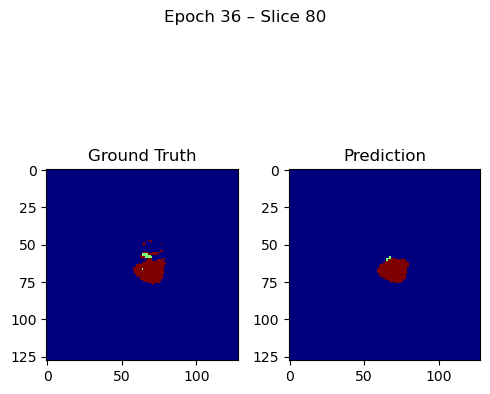

Epoch 36/100
 Train Loss: 0.1621
 Val Loss: 0.1915
 Val Dice Score (mean): 0.8173


100%|██████████| 7/7 [00:26<00:00,  3.82s/it]

(4, 1, 155, 128, 128)


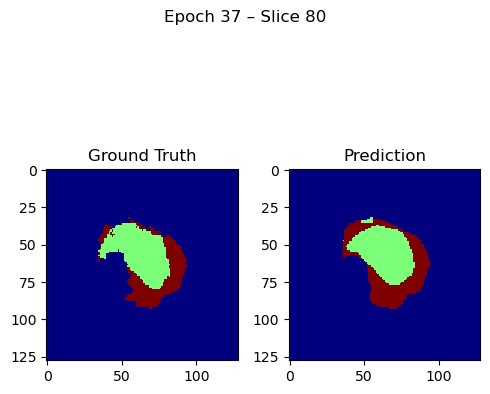

Model improved. Checkpoint saved at epoch 37
Epoch 37/100
 Train Loss: 0.1602
 Val Loss: 0.1836
 Val Dice Score (mean): 0.8215


100%|██████████| 7/7 [00:24<00:00,  3.53s/it]

(4, 1, 155, 128, 128)


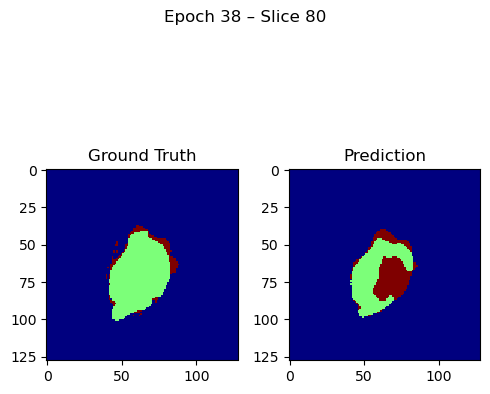

Epoch 38/100
 Train Loss: 0.1568
 Val Loss: 0.2022
 Val Dice Score (mean): 0.8155


100%|██████████| 7/7 [00:23<00:00,  3.37s/it]


(4, 1, 155, 128, 128)


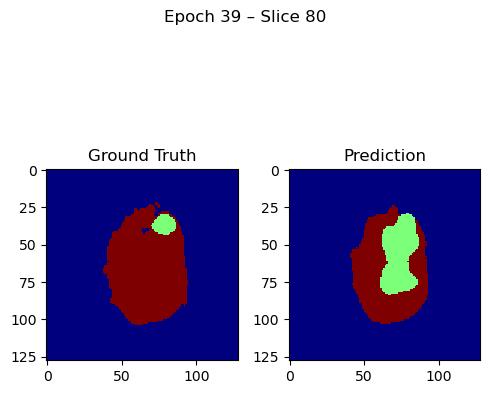

Epoch 39/100
 Train Loss: 0.1517
 Val Loss: 0.1845
 Val Dice Score (mean): 0.8213


100%|██████████| 7/7 [00:22<00:00,  3.20s/it]

(4, 1, 155, 128, 128)


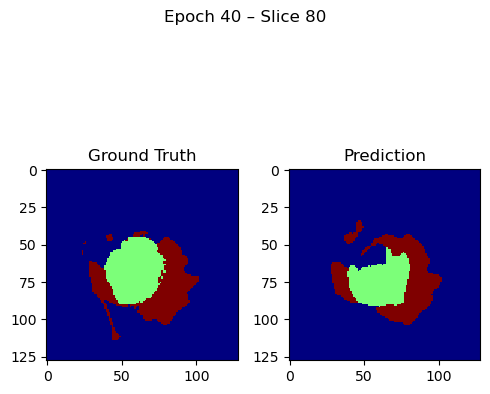

Epoch 40/100
 Train Loss: 0.1494
 Val Loss: 0.1840
 Val Dice Score (mean): 0.8291


100%|██████████| 7/7 [00:23<00:00,  3.36s/it]


(4, 1, 155, 128, 128)


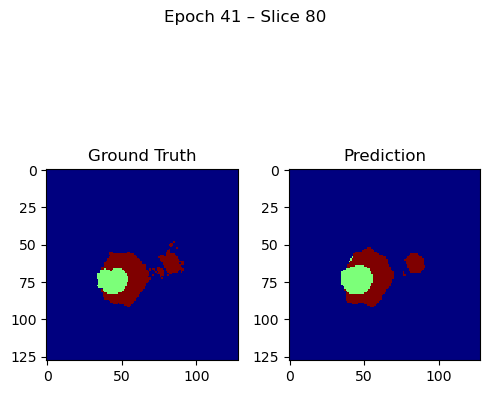

Model improved. Checkpoint saved at epoch 41
Epoch 41/100
 Train Loss: 0.1525
 Val Loss: 0.1787
 Val Dice Score (mean): 0.8273


100%|██████████| 7/7 [00:18<00:00,  2.66s/it]


(4, 1, 155, 128, 128)


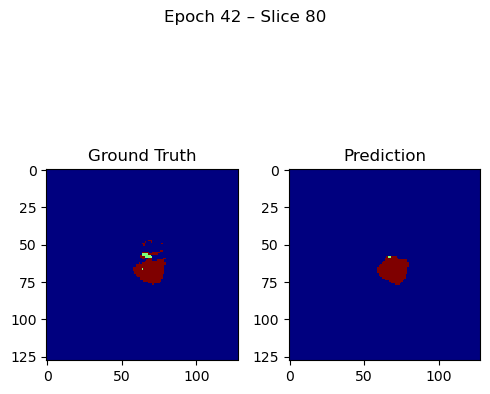

Epoch 42/100
 Train Loss: 0.1537
 Val Loss: 0.1876
 Val Dice Score (mean): 0.8208


100%|██████████| 7/7 [00:22<00:00,  3.16s/it]


(4, 1, 155, 128, 128)


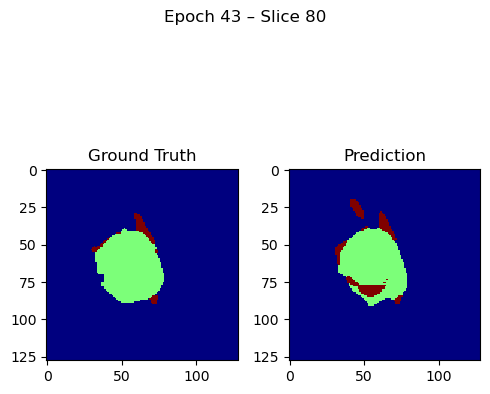

Model improved. Checkpoint saved at epoch 43
Epoch 43/100
 Train Loss: 0.1514
 Val Loss: 0.1775
 Val Dice Score (mean): 0.8305


 65%|██████▌   | 17/26 [00:57<00:29,  3.31s/it]

In [ ]:
""" Training Setup """
from torch import optim
from torch.utils.data import DataLoader
from tqdm import tqdm
from monai.losses.dice import DiceLoss
from monai.metrics import DiceMetric
from monai.transforms import AsDiscrete

# Hyperparameters
batch_size = 8
num_epochs = 100
learning_rate = 0.0001  # 1e-4

# DataLoader for training and validation
train_loader = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=batch_size, shuffle=True)

# Loss function and optimizer
criterion = DiceLoss(include_background=True, to_onehot_y=True, softmax=True)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

# Device setup (prefer GPU if available)
device = torch.device("cuda:5" if torch.cuda.is_available() else "cpu")
print(f"Training on: {device}")
model = model.to(device)

# Dice score calculation
dice_metric = DiceMetric(include_background=True, reduction="mean")
post_label = AsDiscrete(to_onehot=model.num_classes, dim=1)
post_pred = AsDiscrete(argmax=True, to_onehot=model.num_classes, dim=1)

# Checkpoints
best_val_loss = float('inf')
checkpoint_path = "best_model.pth"

# Lists to store training progress
train_losses = []
val_losses = []
val_accuracies = []
all_dice = []

# Training and validation loop
for epoch in range(num_epochs):
    model.train()
    current_loss = 0.0

    # Training Loop
    for batch in tqdm(train_loader):
        subject, images, labels = batch
        images, labels = images.to(device), labels.to(device)

        optimizer.zero_grad(set_to_none=True)
       
        outputs = model(images)
        loss = criterion(outputs, labels)
        
        loss.backward()
        optimizer.step()

        current_loss += loss.item()

    avg_train_loss = current_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    # Validation Loop
    model.eval()
    val_loss = 0.0
    val_acc_total = 0.0
    val_batches = 0

    dice_metric.reset() # Reset metric before each epoch

    with torch.no_grad():
        for val_idx, batch in enumerate(tqdm(val_loader)):
            subject, images, labels = batch
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            
            loss = criterion(outputs, labels)
            val_loss += loss.item()

            # Dice score calculation
            labels = labels.unsqueeze(1) 
            pred_onehot = post_pred(outputs)
            label_onehot = post_label(labels)

            dice_metric(y_pred=pred_onehot, y=label_onehot)

            _, predicted = torch.max(outputs, 1)

        # Preprocessing for visualization
        pred_classes = torch.argmax(outputs, dim=1).cpu().numpy()  # [B, D, H, W]
        true_labels = labels.squeeze(1).cpu().numpy()              # [B, D, H, W]
        print(true_labels.shape)
        
        slice_idx = 80 # select slice index
        
        # visualize the first volume in the batch
        pred_slice = pred_classes[0][slice_idx]             # [H, W]
        label_slice = true_labels[0, 0, slice_idx, :, :]    # [H, W]
        
        # display the ground truth and prediction
        fig, axs = plt.subplots(1, 2, figsize=(5, 5))
        
        axs[0].imshow(label_slice, cmap='jet', interpolation='none')
        axs[0].set_title("Ground Truth")
        
        axs[1].imshow(pred_slice, cmap='jet', interpolation='none')
        axs[1].set_title("Prediction")
        
        plt.suptitle(f"Epoch {epoch + 1} – Slice {slice_idx}")
        plt.tight_layout()
        plt.savefig(f"val_prediction_epoch{epoch + 1}_slice{slice_idx}.png") # optinal: if you want to save the images
        plt.show() 

    
    avg_val_loss = val_loss / len(val_loader)
    avg_val_dice = dice_metric.aggregate().cpu().numpy()
    dice_metric.reset()

    val_losses.append(avg_val_loss)

    # Save best model
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        torch.save(model.state_dict(), checkpoint_path)
        print(f"Model improved. Checkpoint saved at epoch {epoch + 1}")

    print(f"Epoch {epoch + 1}/{num_epochs}")
    print(f" Train Loss: {avg_train_loss:.4f}")
    print(f" Val Loss: {avg_val_loss:.4f}")
    print(f" Val Dice Score (mean): {avg_val_dice.mean():.4f}")

    dice = avg_val_dice.mean()
    all_dice.append(dice)

# Print final average Dice score
print(np.mean(all_dice))

1) Visualisiert den Verlauf des Trainings- und des Evaluationsloss in einem Graphen.

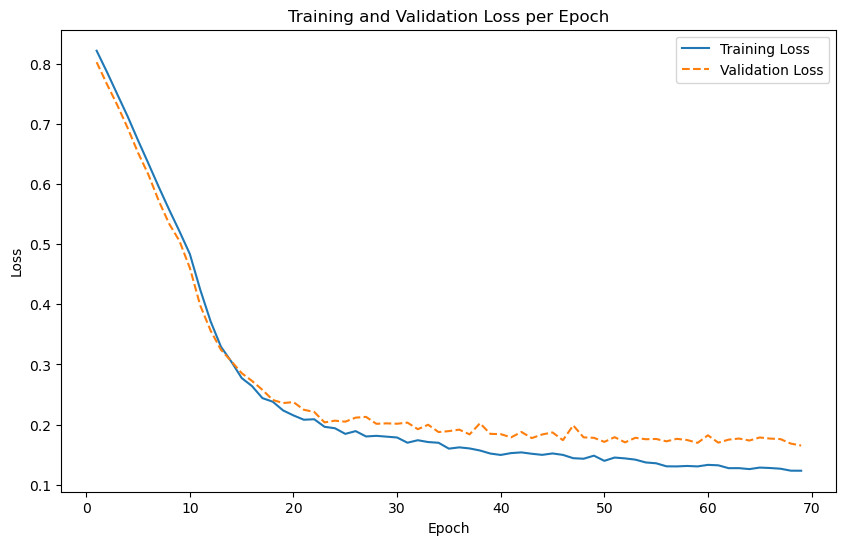

In [17]:
""" Visualization of the training and validation loss per epoch"""

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(train_losses) + 1), train_losses, label="Training Loss")
plt.plot(range(1, len(val_losses) + 1), val_losses, label="Validation Loss", linestyle='--')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss per Epoch")
plt.legend()
plt.show()

2) Visualisiert einige Beispiele eures Trainings  mit den zugehörigen Labeldaten. Denkt daran, dass die  outputs des Netzes eine Wahrscheinlichkeit für die Zugehörigkeit des Pixels zu den Klassen 1-3 ausgeben. Der Pixel sollte die Klasse mit der höchsten Wahrscheinlichkeit bekommen. Um also das vorhergesagte Labelbild zu erzeugen, könnt ihr die Funktion [*torch.argmax()*](https://pytorch.org/docs/stable/generated/torch.argmax.html) nutzen.

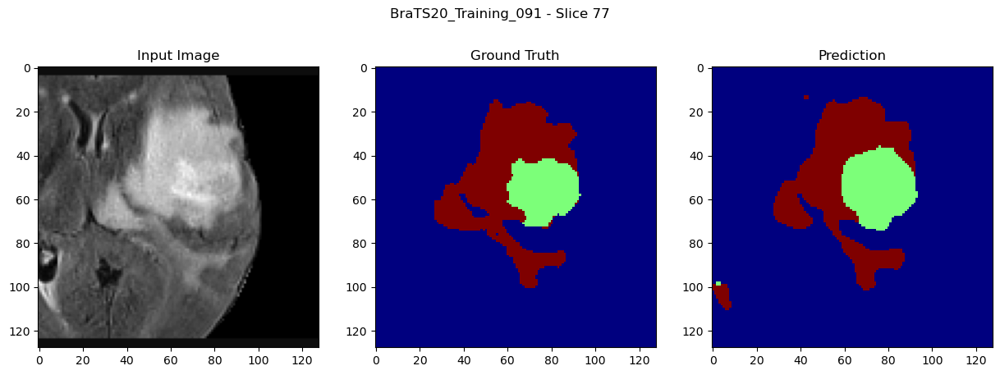

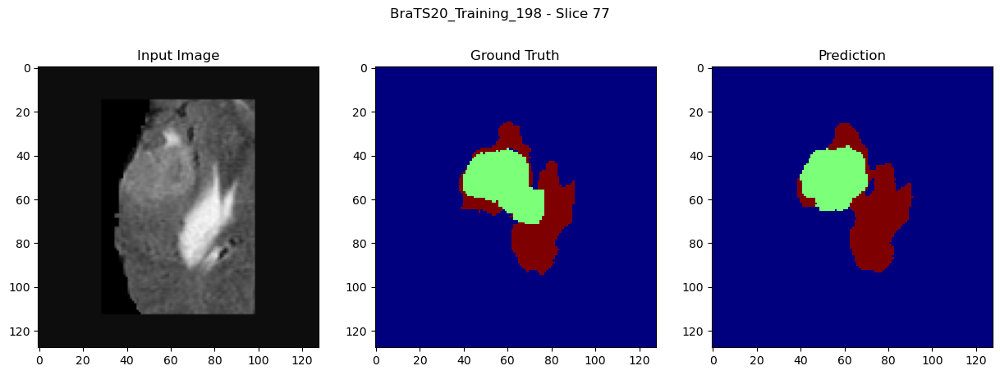

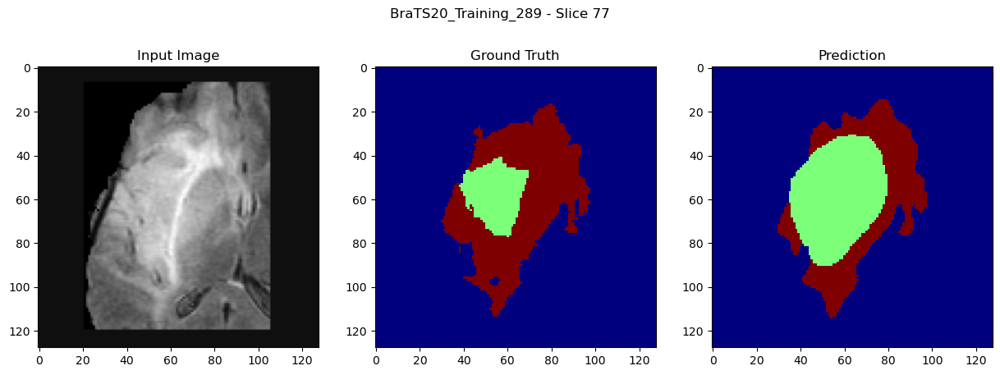

In [18]:
""" Visualize some example predictions along with their ground truth labels"""

def show_predictions(model, dataloader, device, num_examples=3):
    """
    Displays example predictions from the model alongside the input image and ground truth.

    Args:
        model (nn.Module): The trained segmentation model.
        dataloader (DataLoader): DataLoader providing the input data.
        device (torch.device): Device to run the model on (CPU or GPU).
        num_examples (int): Number of prediction examples to show.
    """
    model.eval()
    with torch.no_grad():
        for i, batch in enumerate(dataloader):
            subject, images, labels = batch
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)

            # Use the first image in the current batch
            img = images[0].cpu().numpy()
            label = labels[0].cpu().numpy()
            pred = preds[0].cpu().numpy()

            # Display the middle slice of the 3D volume
            mid_slice = img.shape[1] // 2

            # Plot input, ground truth, and prediction side by side
            fig, axes = plt.subplots(1, 3, figsize=(15,5))
            axes[0].imshow(img[0, mid_slice, :, :], cmap='gray') # show flair image
            axes[0].set_title('Input Image')
            axes[1].imshow(label[0, mid_slice, :, :], cmap='jet', interpolation='none')
            axes[1].set_title('Ground Truth')
            axes[2].imshow(pred[mid_slice, :, :], cmap='jet', interpolation='none')
            axes[2].set_title('Prediction')
            plt.suptitle(f"{subject['subject_id'][0]} - Slice {mid_slice}")
            plt.show()

            if i + 1 == num_examples:
                break

# Show predictions for the validation set
show_predictions(model, val_loader, device, num_examples=3)


## 4. Testen des Modells mit unbekannten Daten:
Im letzen Schritt wollen wir sehen, wie gut das trainierte Netz auf unbekannten Daten arbeitet. Überarbeitet dazu euer *Dataset*, sodass auch die Bilddaten ohne Labels geladen werden können, oder erstellt ein Neues.
Initalisiert einen *DataLoader*  für den Testdatensatz und lasst die Bilder durch das Netz laufen.

In [19]:
"""BraTSDataset_Val defines the dataset class for loading BraTS validation data."""

DATADIR = "/home/shared/data/BraTS-torch-images-val/"

# List and sort all subject IDs in the directory
subject_IDs_ValData = os.listdir(DATADIR)
subject_IDs_ValData.sort(key=lambda x: int(x[len('BraTS20_Training_'):]))

class BRATSDataset_Val(Dataset):
    def __init__(self, list, train=True):
        """
        Initializes the validation dataset for BraTS data.

        Args:
            list (list): A list of subject IDs.
            train (bool): Flag indicating whether this is a training dataset.
        """
        super().__init__()
        self.list = list
        self.train = train
        self.sequences = ("flair", "t1", "t2", "t1ce")
        
        # Store all loaded data in a list
        self.data = []

        for subject_id in self.list:
            images = {}
            for seq in self.sequences:
                filename = os.path.join(DATADIR, subject_id, f"{subject_id}_{seq}.nii.gz")
                images[seq] = filename

            # Save the subject and all sequence file paths in a dictionary
            eintrag = {
                "Sub_ID": subject_id,
                "flair": images["flair"],
                "t1": images["t1"],
                "t1ce": images["t1ce"],
                "t2": images["t2"]
            }
            self.data.append(eintrag)     
        
    def __len__(self):
        """
        Returns:
            int: Number of elements (subjects) in the dataset.
        """
        return len(self.data)

    def __getitem__(self, idx):
        """ Loads and returns the image tensor and subject ID for the given index.

        Args:
            idx (int): Index of the subject.

        Returns:
            Tuple[Dict[str, str], torch.Tensor]:
                - A dictionary with the subject ID.
                - A normalized image tensor of shape (4, D, H, W).
        """
        entry2 = self.data[idx]
        entry = {}

        for seq in self.sequences:
            # Load each sequence as SimpleITK image
            entry[seq] = sitk.ReadImage(entry2[seq], outputPixelType=sitk.sitkFloat32 if seq != "label" else sitk.sitkUInt8)

        # Convert each image to numpy array of shape (D, H, W)
        flair = sitk.GetArrayFromImage(entry["flair"])
        t1 = sitk.GetArrayFromImage(entry["t1"])
        t1ce = sitk.GetArrayFromImage(entry["t1ce"])
        t2 = sitk.GetArrayFromImage(entry["t2"])

        # Stack all modalities into one tensor (shape: 4, D, H, W)
        image_tupel = torch.stack([
            torch.from_numpy(flair),
            torch.from_numpy(t1),
            torch.from_numpy(t1ce),
            torch.from_numpy(t2)
        ], dim=0).float()

        # Normalize the image tensor
        image_tupel_valDS = normalize_tensor(image_tupel)
        
        # Store subject ID in a dictionary
        subject_id_valDS = {'subject_id': entry2["Sub_ID"]}

        return subject_id_valDS, image_tupel_valDS

# Instantiate the validation dataset
dataset_ValData = BRATSDataset_Val(subject_IDs_ValData)

2) Seht euch die erzeugten Segmentierungen an.

Val_Dataset geladen
torch.Size([4, 155, 240, 240])
Val Dataset: 54 images


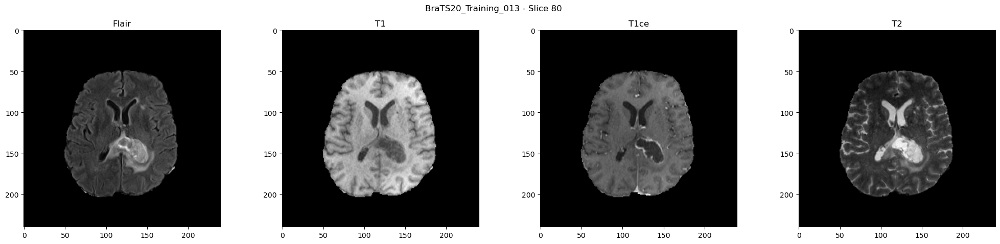

In [20]:
""" Visualize all modalities for a given subject in the BraTS validation dataset"""

# Debug output
print("Val_Dataset geladen")
subject_id_valDS, image_tupel_valDS = dataset_ValData[1]
print(image_tupel_valDS.shape)
print('Val Dataset: {} images'.format(len(dataset_ValData)))

# Visualize all modalities for a given subject and slice

slice_idx = 80
sequences_valDS = ['Flair', 'T1', 'T1ce', 'T2']

fig, axs = plt.subplots(1, 4, figsize=(25, 5))
for i in range(4):
    slice_img = image_tupel_valDS[i, slice_idx, :, :].numpy()
    axs[i].imshow(slice_img, cmap='gray')
    axs[i].set_title(sequences_valDS[i])

plt.suptitle(f"{subject_id_valDS['subject_id']} - Slice {slice_idx}")
plt.show()

  0%|          | 0/14 [00:00<?, ?it/s]

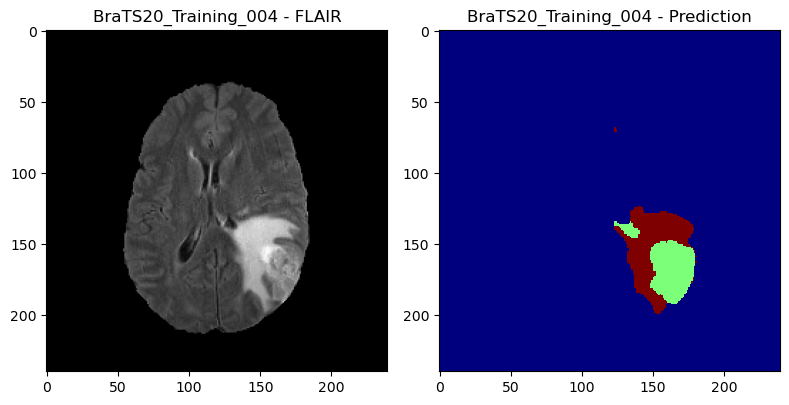

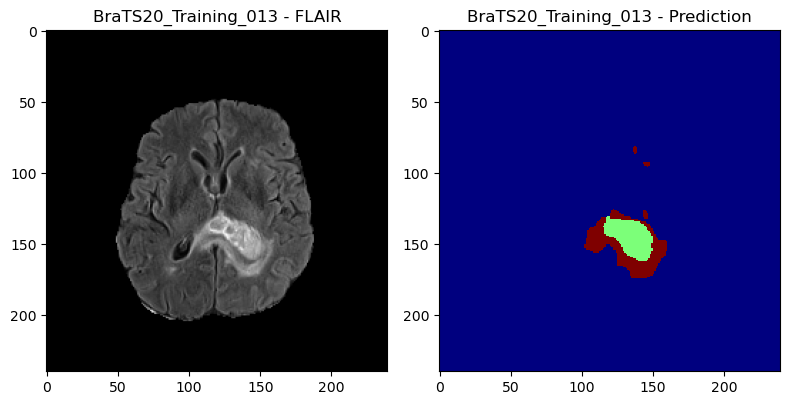

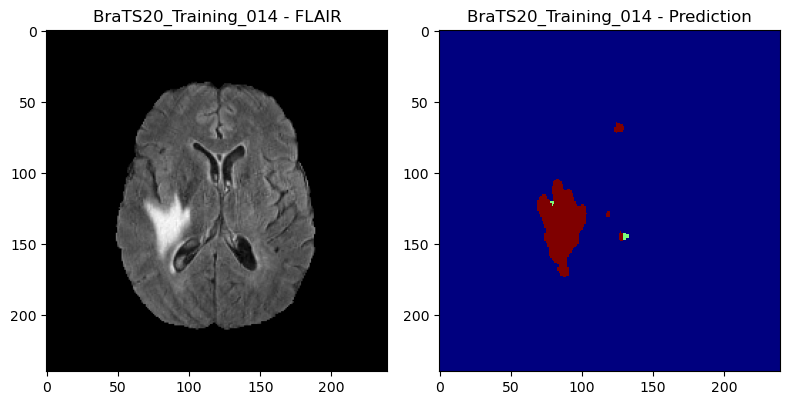

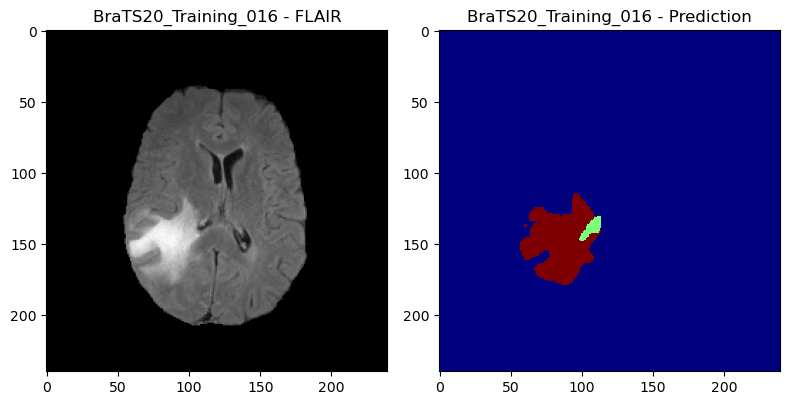

  7%|▋         | 1/14 [00:02<00:28,  2.16s/it]

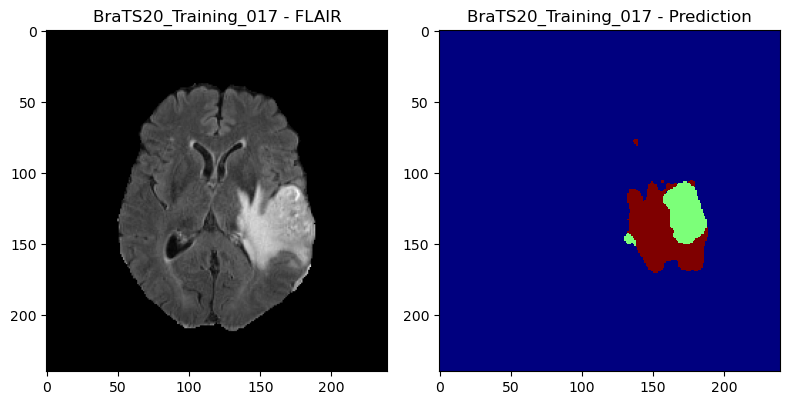

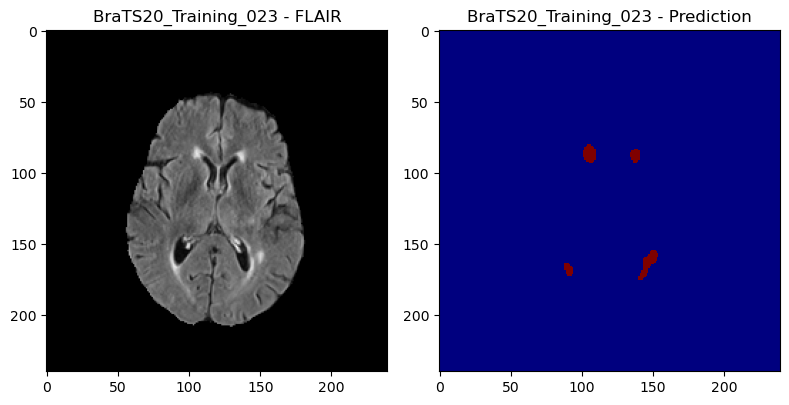

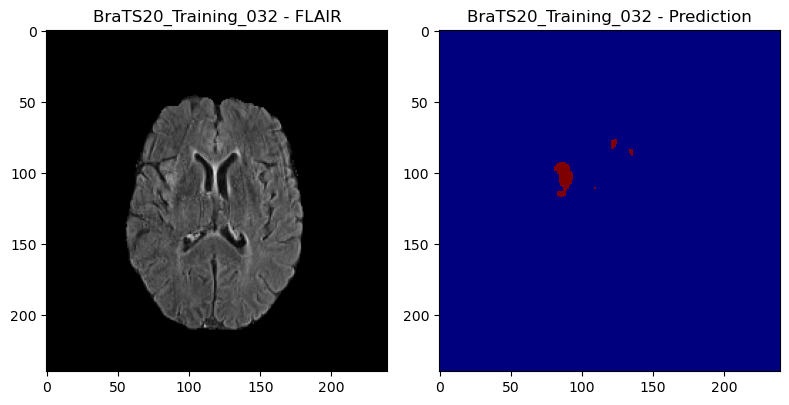

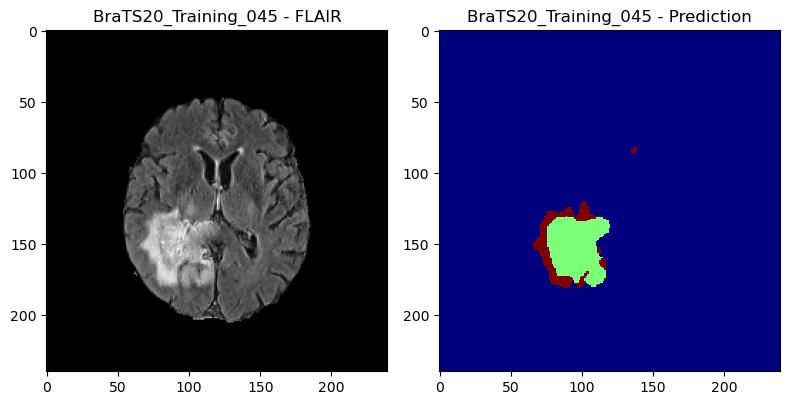

 14%|█▍        | 2/14 [00:04<00:28,  2.40s/it]

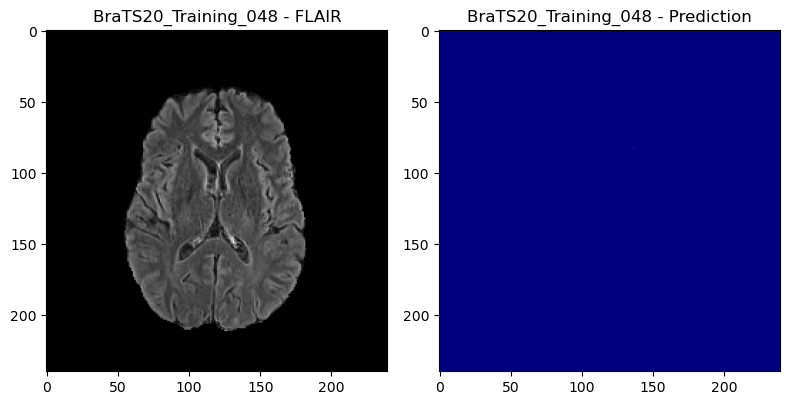

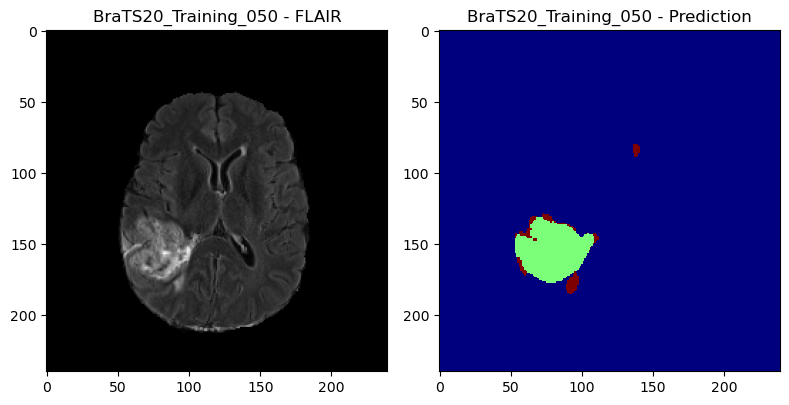

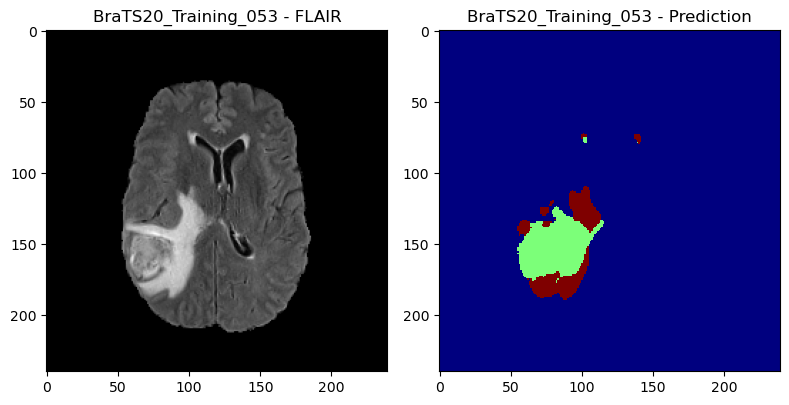

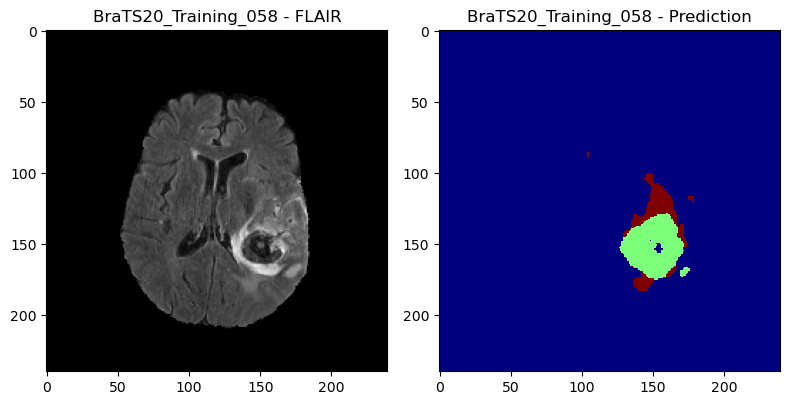

 21%|██▏       | 3/14 [00:07<00:27,  2.51s/it]

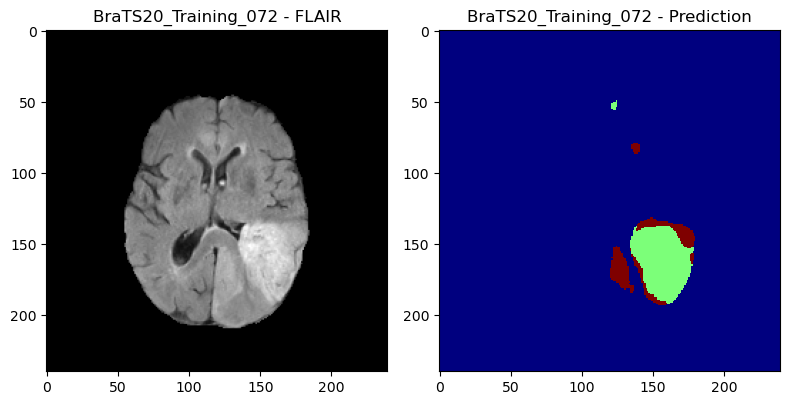

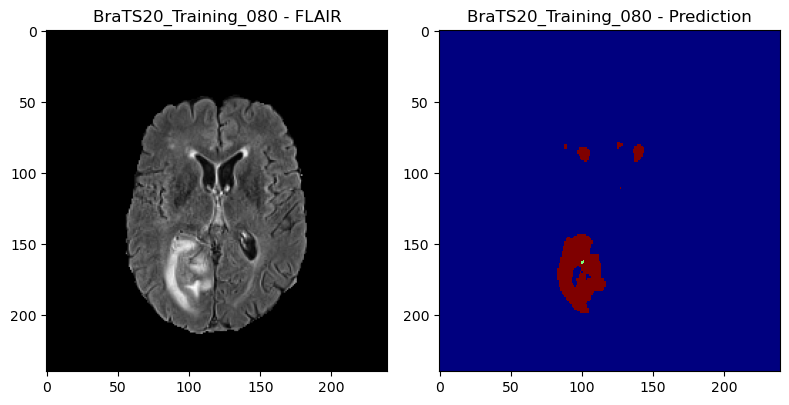

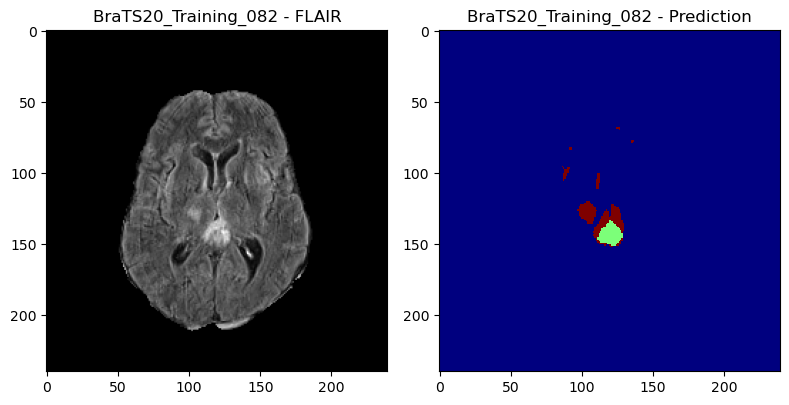

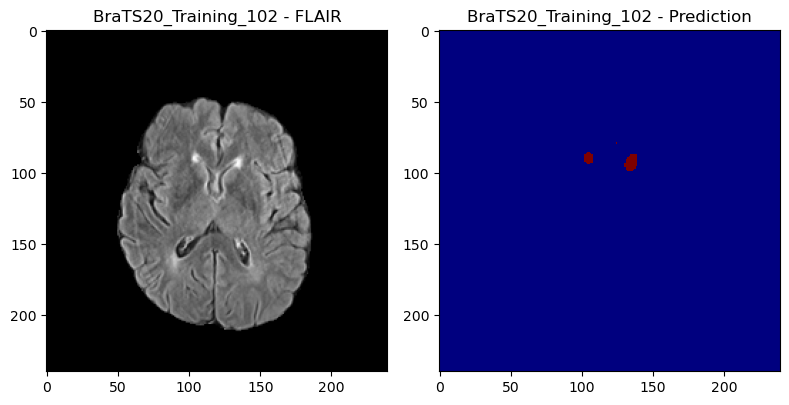

 29%|██▊       | 4/14 [00:10<00:26,  2.64s/it]

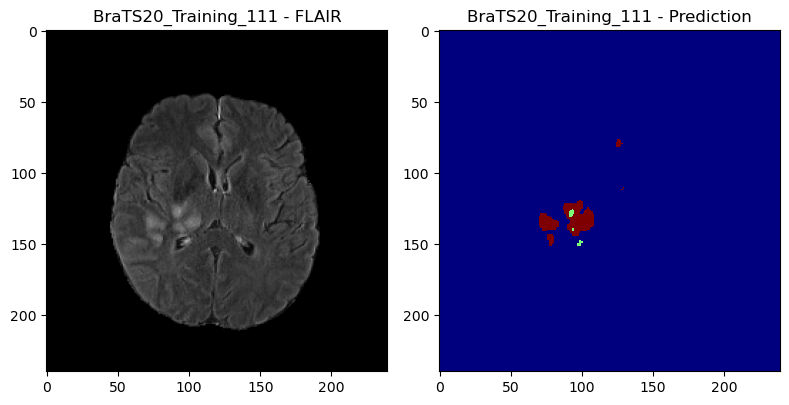

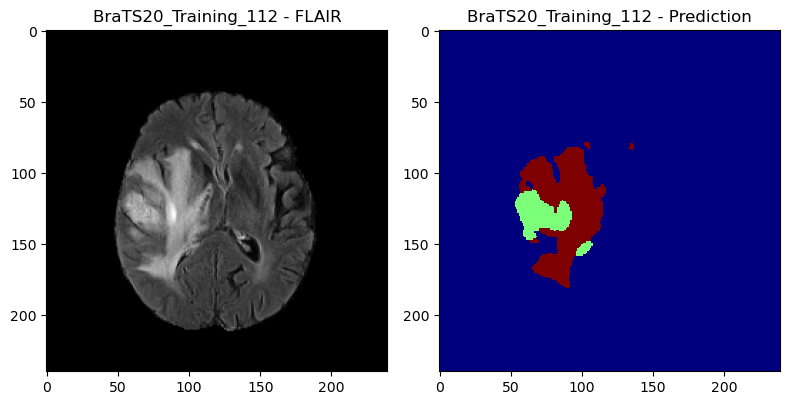

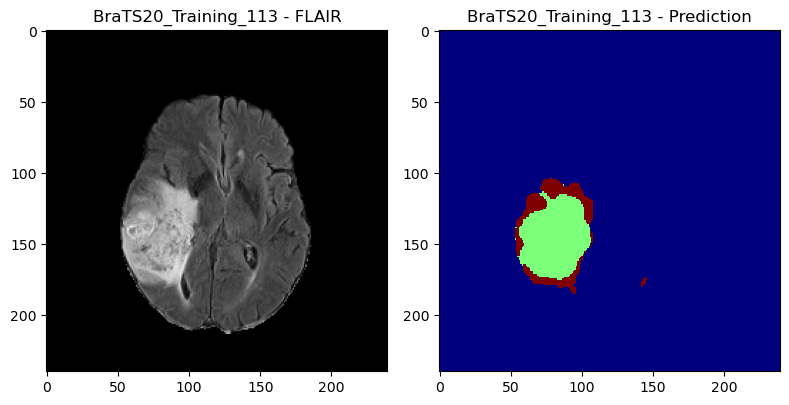

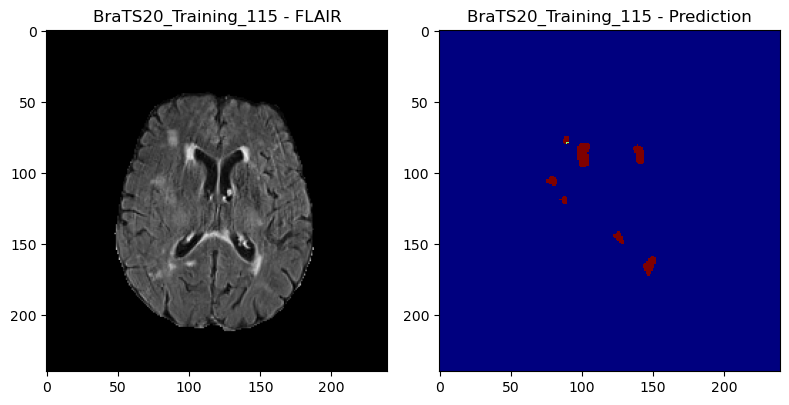

 36%|███▌      | 5/14 [00:11<00:20,  2.24s/it]

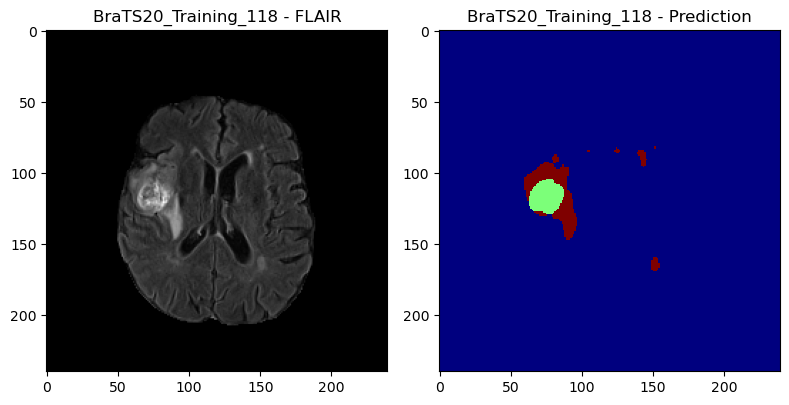

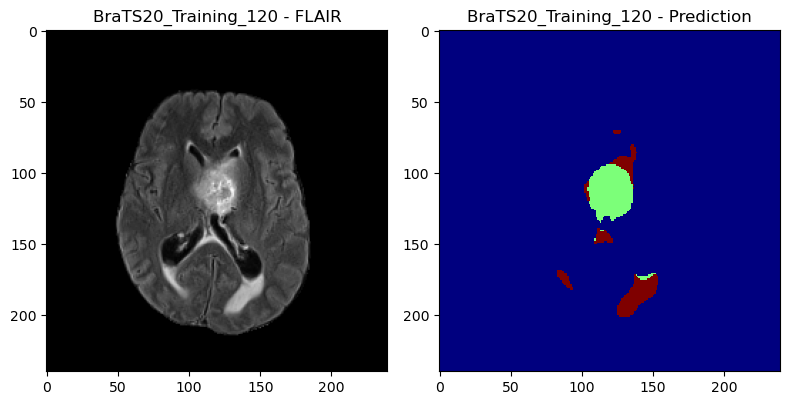

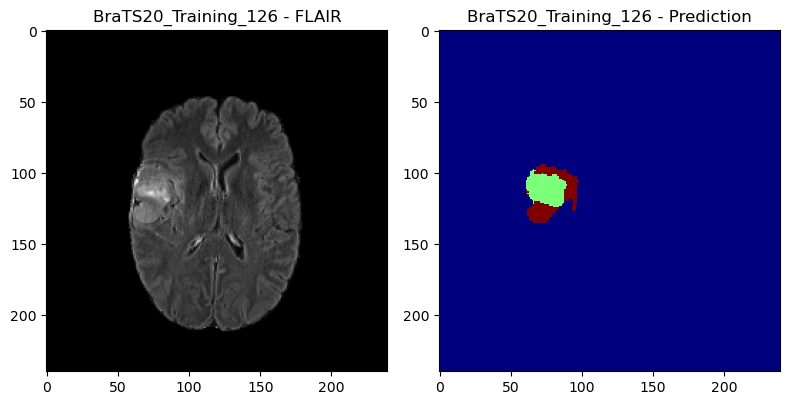

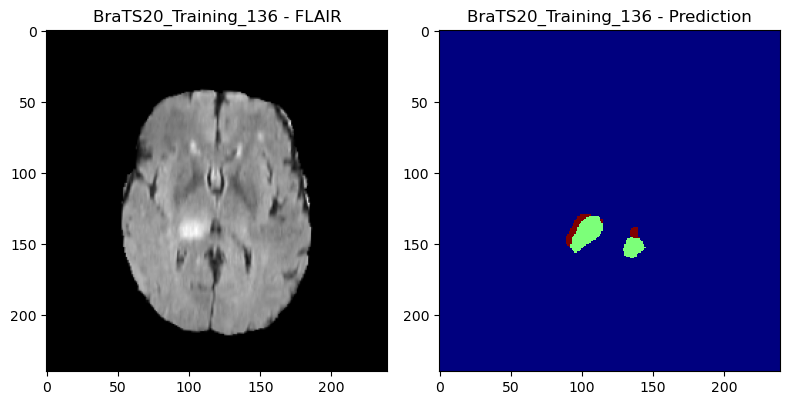

 43%|████▎     | 6/14 [00:13<00:16,  2.00s/it]

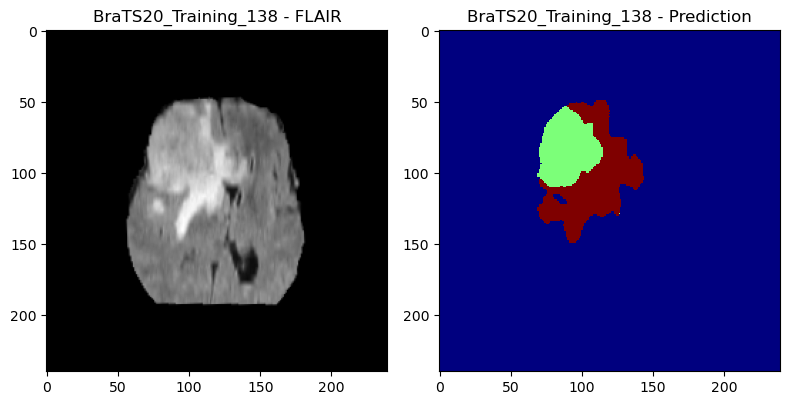

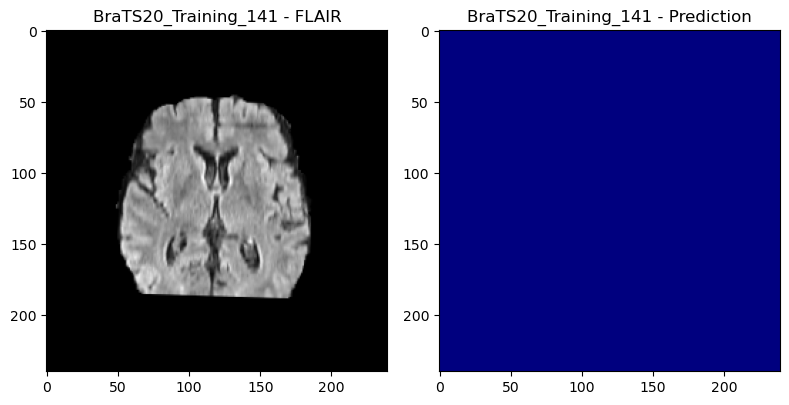

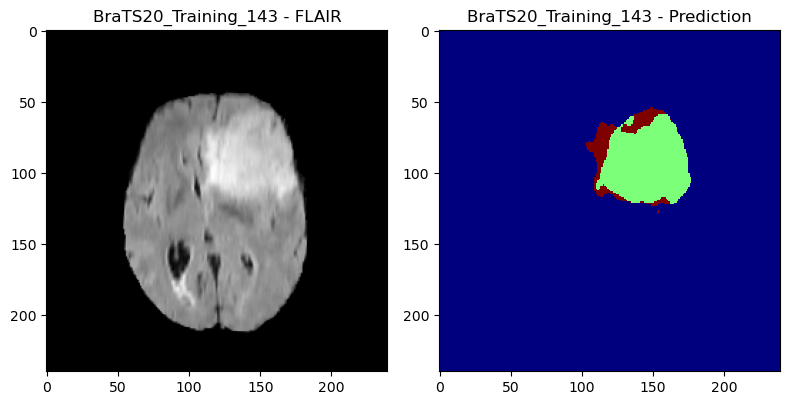

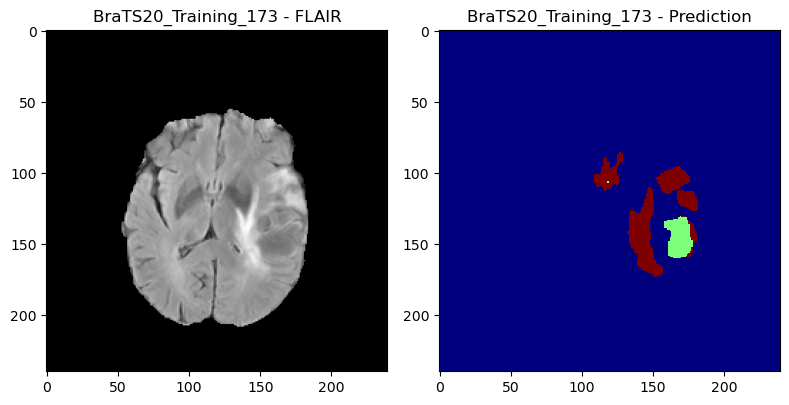

 50%|█████     | 7/14 [00:15<00:15,  2.24s/it]

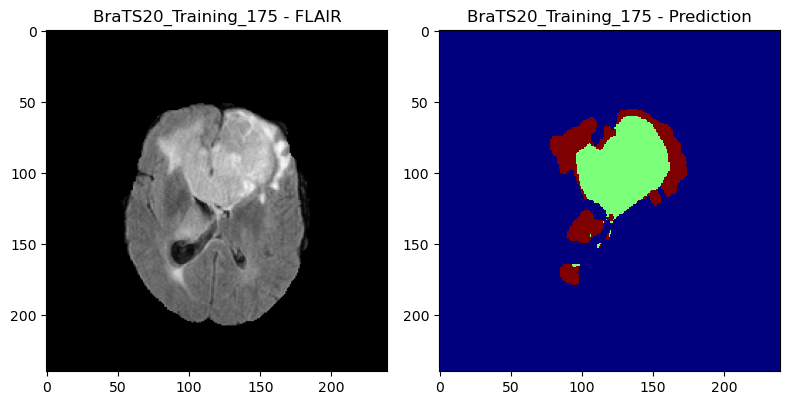

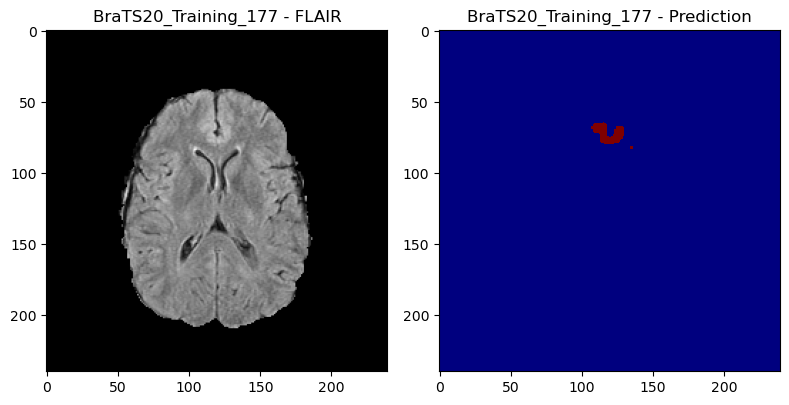

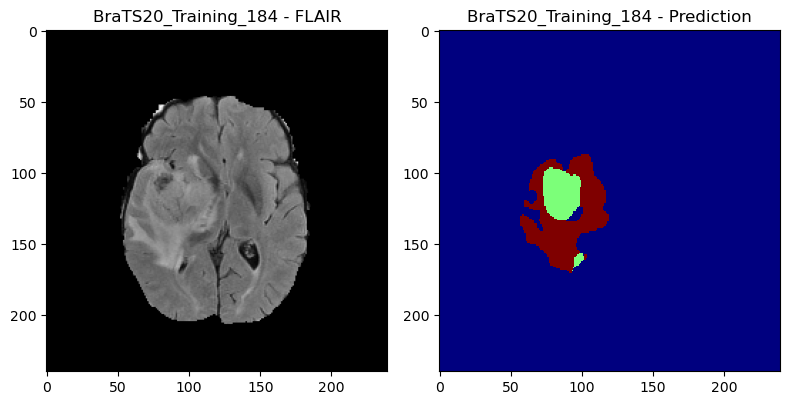

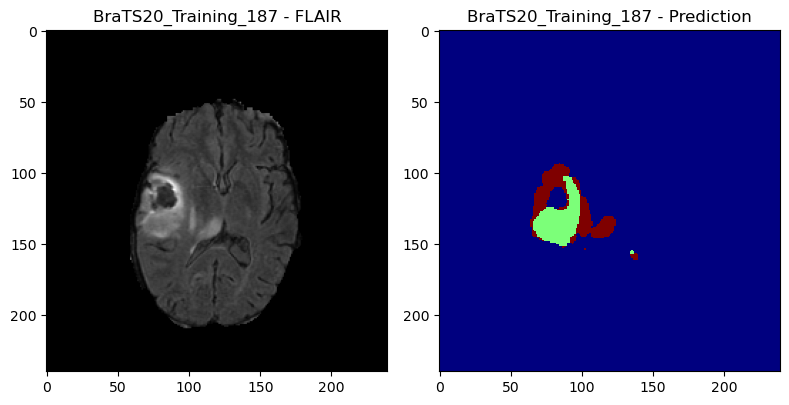

 57%|█████▋    | 8/14 [00:17<00:12,  2.05s/it]

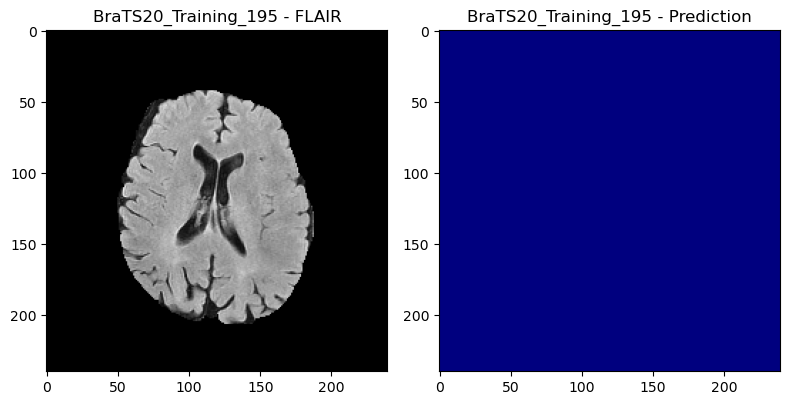

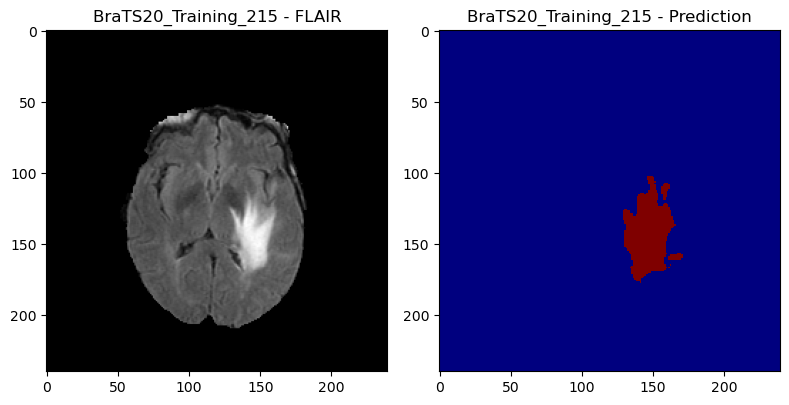

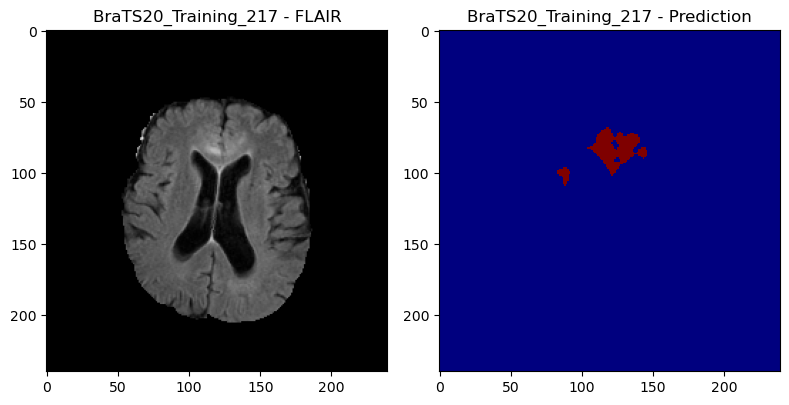

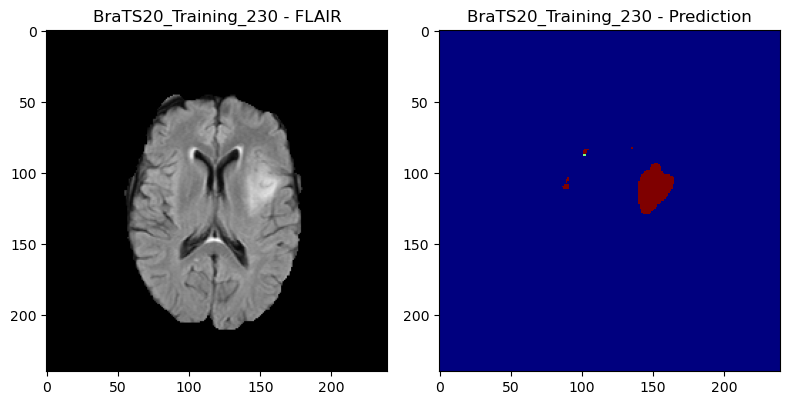

 64%|██████▍   | 9/14 [00:19<00:09,  1.90s/it]

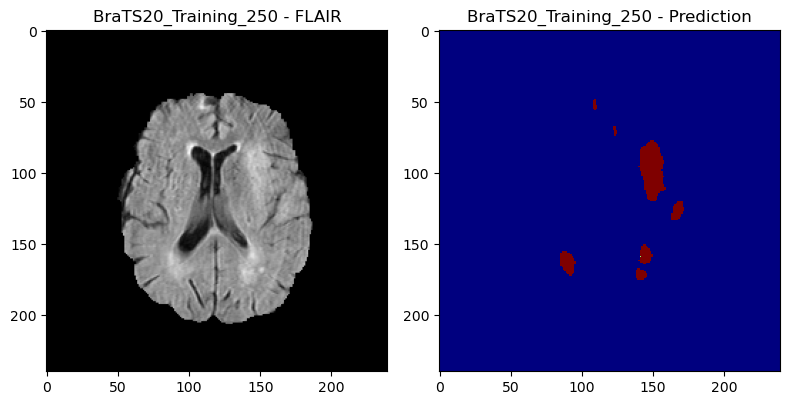

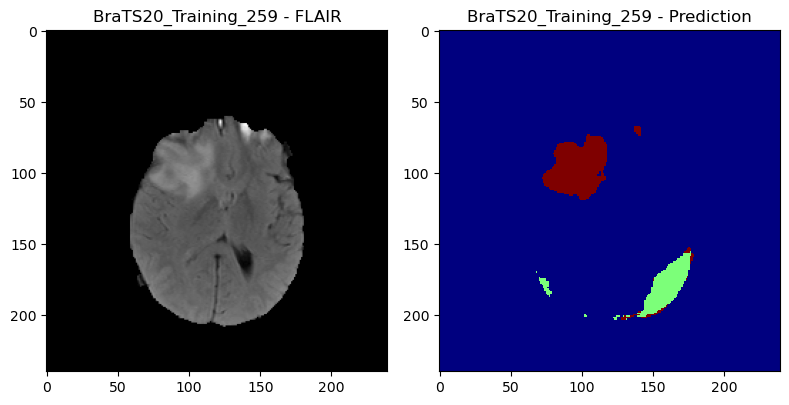

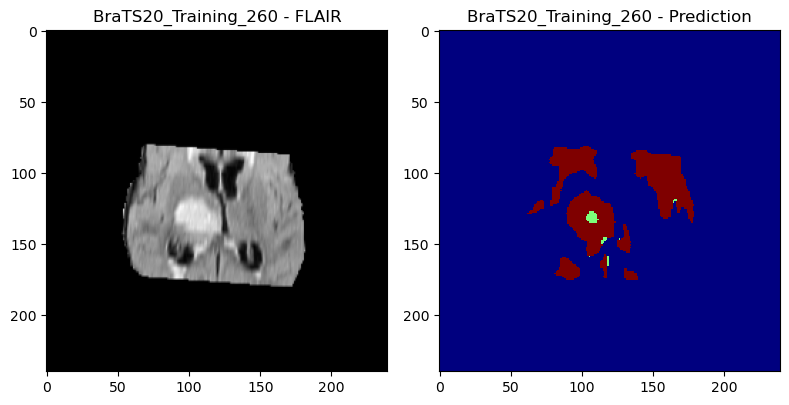

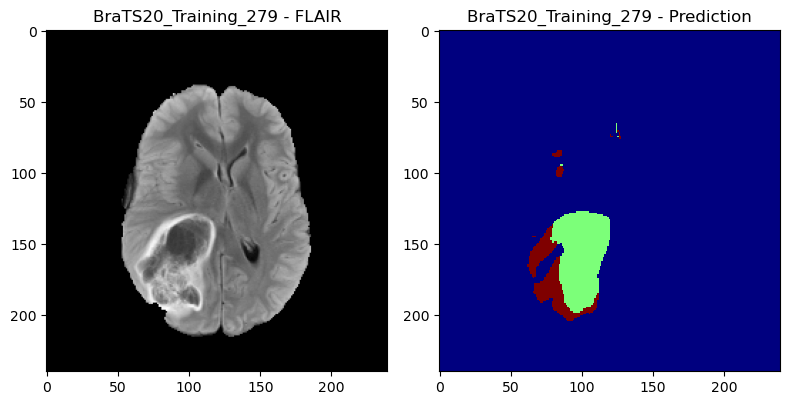

 71%|███████▏  | 10/14 [00:20<00:07,  1.85s/it]

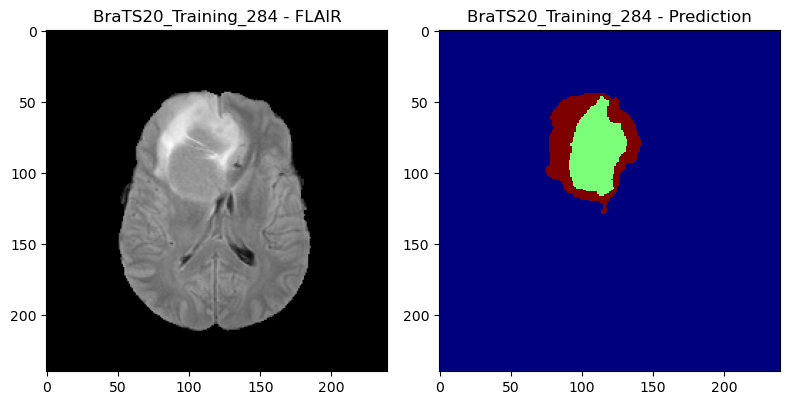

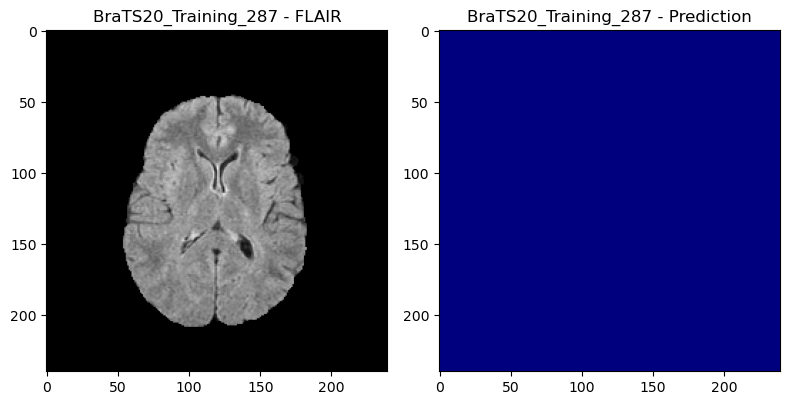

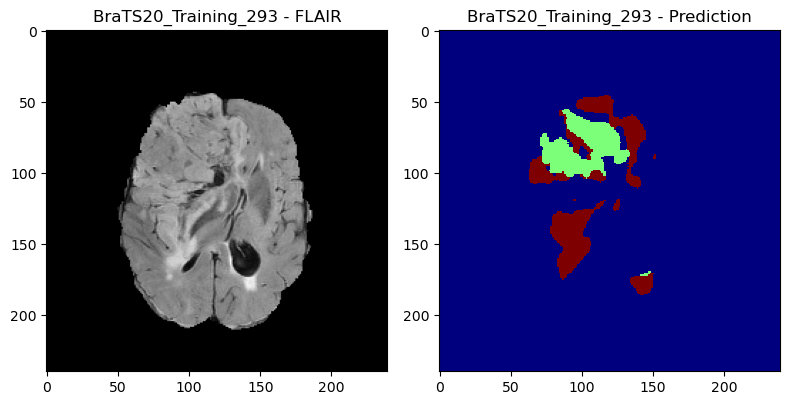

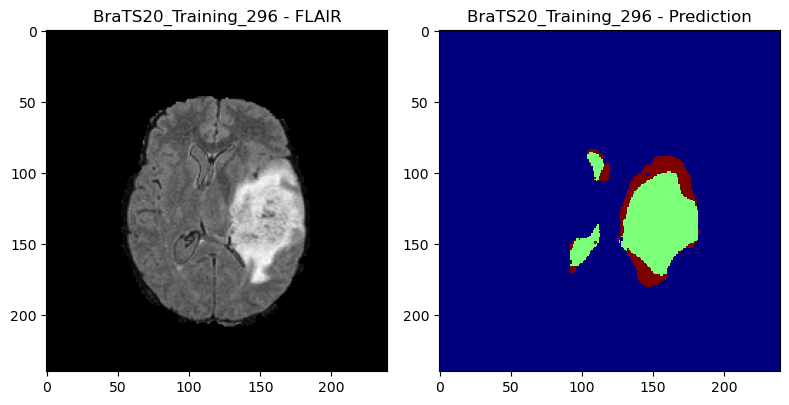

 79%|███████▊  | 11/14 [00:23<00:06,  2.12s/it]

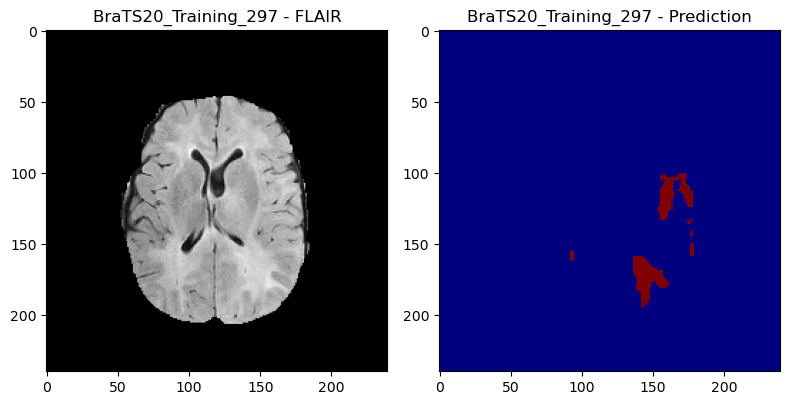

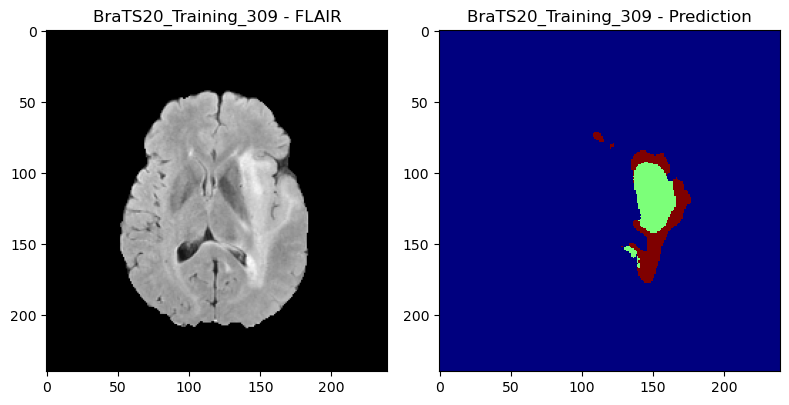

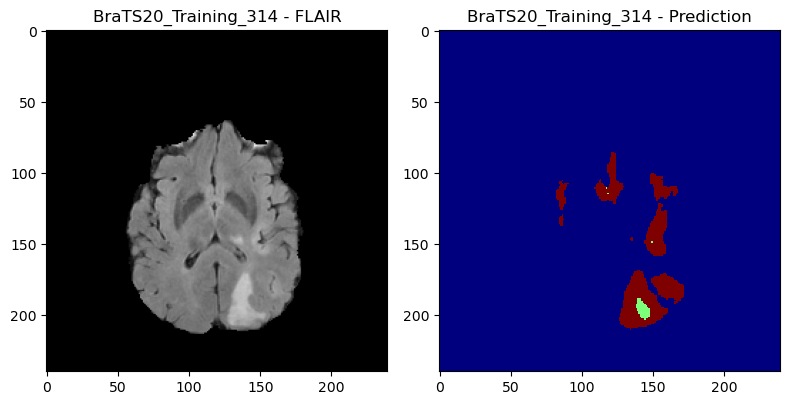

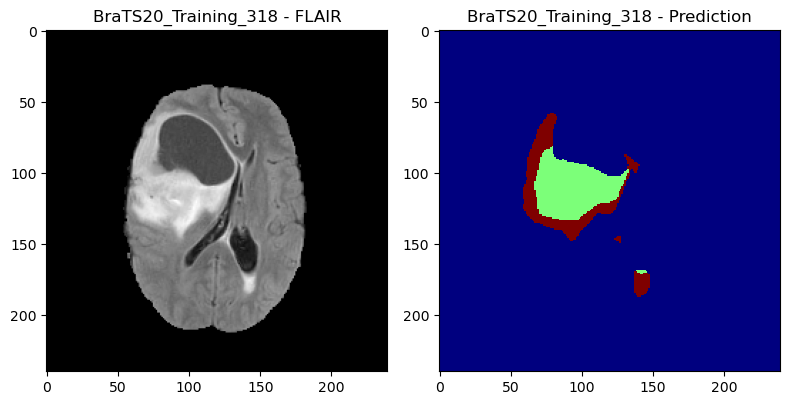

 86%|████████▌ | 12/14 [00:25<00:03,  1.92s/it]

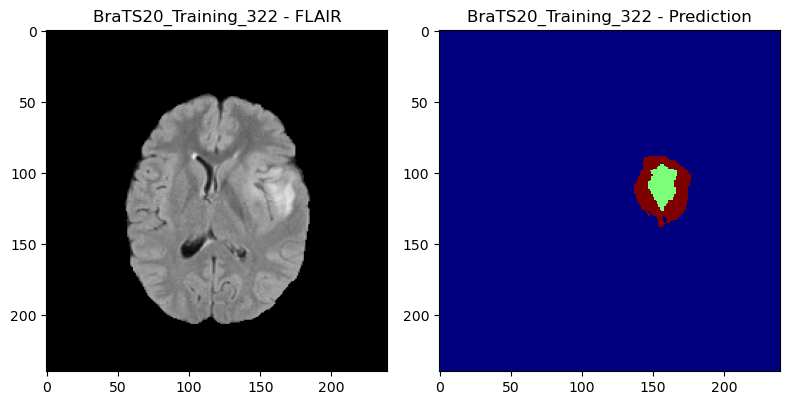

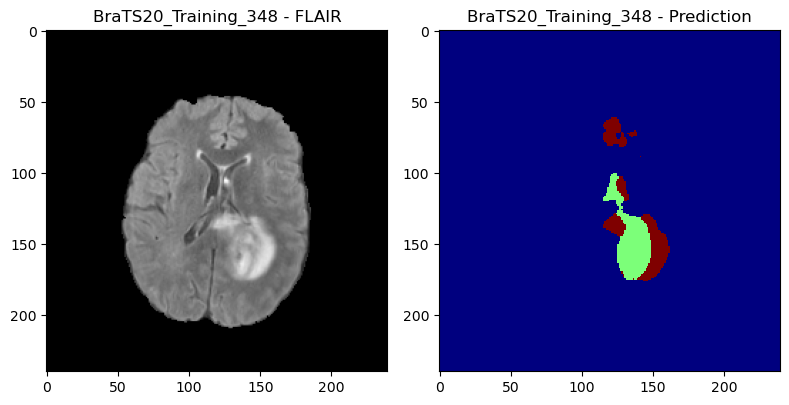

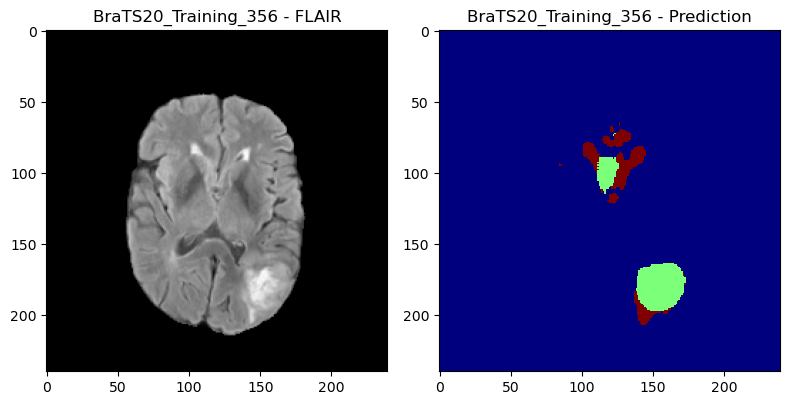

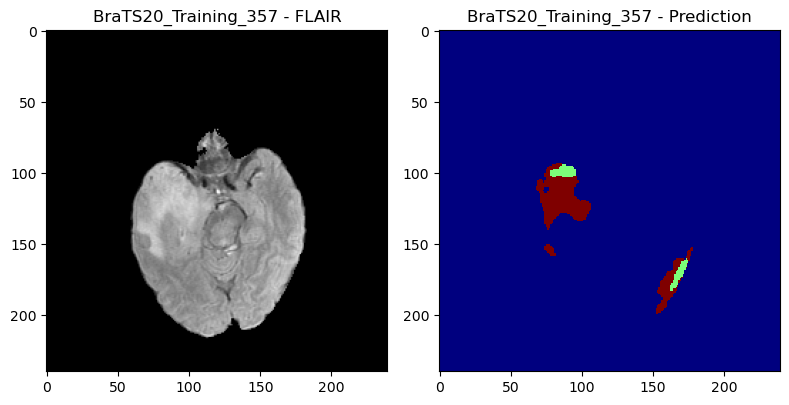

 93%|█████████▎| 13/14 [00:26<00:01,  1.85s/it]

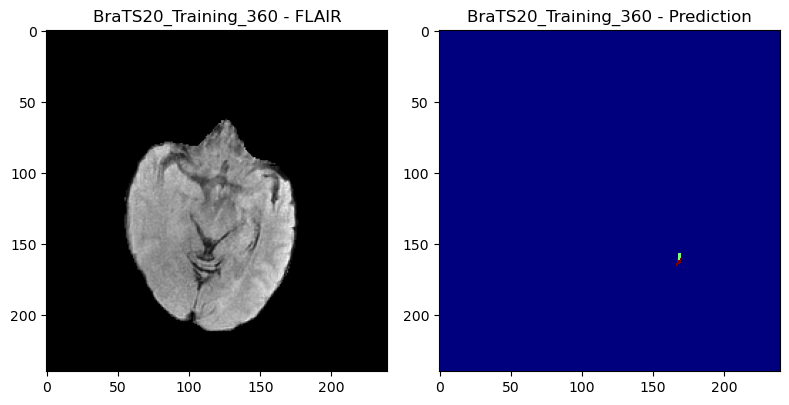

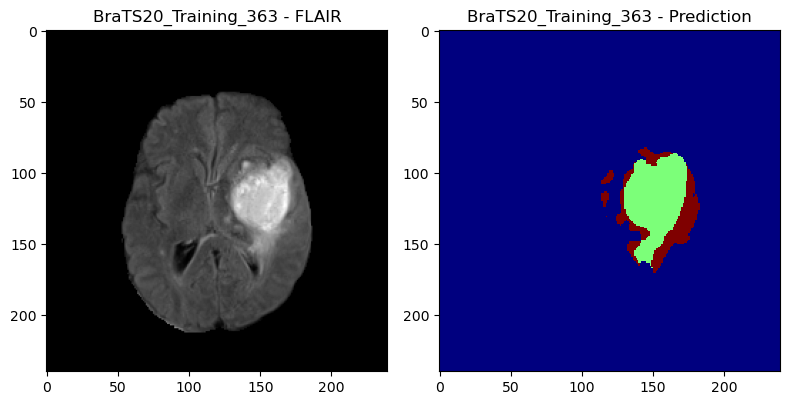

100%|██████████| 14/14 [00:28<00:00,  2.01s/it]


In [29]:
""" Run inference on the BraTS validation dataset using the best trained model."""

# Parameters
RESULTDIR = 'Results/BraTS20_val_2' # Directory to save results
DATADIR = '/home/shared/data/BraTS-torch-images-val/' # Directory with validation data
MODEL_PATH = 'best_model.pth' # Trained model path
BATCH_SIZE = 4
device = torch.device("cuda:3" if torch.cuda.is_available() else "cpu")

# Load Validation Dataset 
validation_loader = DataLoader(dataset_ValData, batch_size=4, shuffle=False)

# Load Trained Model 
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
model.eval()

# Create Output Directory
os.makedirs(RESULTDIR, exist_ok=True)

# Validation loop
with torch.no_grad():
    for val_idx, batch in enumerate(tqdm(validation_loader)):
        subject_dicts, images = batch
        images = images.to(device)

        # Perform inference
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)  # Shape: [B, D, H, W]

        # Process each prediction in the batch
        for i in range(predictions.shape[0]):
            # extract subject ID
            subject_id = subject_dicts['subject_id'][i] if isinstance(subject_dicts, dict) else subject_dicts[i]['subject_id']
            subject_id_padded = str(subject_id).zfill(3)

            # Convert prediction to numpy array and ensure correct dtype
            pred_i = predictions[i].cpu().numpy().astype(np.uint8)  # Shape: [D, H, W]

            # Extract FLAIR image for visualization
            flair = images[i, 0].cpu().numpy()

            # Visualization
            slice_idx = pred_i.shape[0] // 2 # use middle slice for visualization
            flair_slice = flair[slice_idx, :, :]
            pred_slice = pred_i[slice_idx, :, :]
            
            plt.figure(figsize=(8, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(flair_slice, cmap="gray")
            plt.title(f"{subject_id} - FLAIR")

            plt.subplot(1, 2, 2)
            plt.imshow(pred_slice, cmap="jet", interpolation='none')
            plt.title(f"{subject_id} - Prediction")

            plt.tight_layout()
            plt.show()
            
            # Save prediction
            pred_tensor = torch.from_numpy(pred_i).unsqueeze(0)  # Add channel dim: [1, D, H, W]
            #print(pred_tensor.shape) # debug output
            
            save_prediction_bdhw(
                pred_tensor=pred_tensor,
                subject_id=subject_id_padded,
                RESULTDIR=RESULTDIR
            )


In [22]:
import json
import shutil
import os
import SimpleITK as sitk


test_idxes = ['025',
'038',
'062',
'218',
'361',
'235',
'347',
'147',
'090',
'179',
'066',
'152',
'210',
'228',
'133',
'346',
'116']

train_idxes = ["010",
            "029",
            "075",
            "150",
            "180"]

test_idxes_torch = ['101', '342', '007', '291', '266', '328', '218', '334', '002', '160', '216', '125', '208', '256', '327', 
                    '006', '325', '305', '194', '351', '152', '116', '086', '283', '345', '105', '062', '347', '147', '133', 
                    '183', '066', '020', '179', '278', '238', '228', '301', '277', '074', '087', '096', '025', '079', '235', 
                    '311', '210', '211', '339', '039', '038', '350', '361', '083', '090', '346']

val_idxes_torch = ['215', '318', '175', '187', '080', '250', '279', '138', '360', '048', '309', '136', '058', '259', '297', 
                   '173', '141', '363', '032', '053', '348', '296', '322', '016', '230', '217', '023', '014', '293', '050', 
                   '143', '004', '072', '184', '314', '287', '013', '017', '177', '260', '045', '113', '356', '195', '118', 
                   '284', '120', '111', '082', '126', '357', '102', '115', '112']

def save_prediction_bdhw(pred_tensor, subject_id, RESULTDIR):
    """
    Saves a segmentation prediction tensor with shape [B, D, H, W] as a NIfTI file.

    Args:
        pred_tensor (torch.Tensor): The predicted segmentation tensor, shape [1, D, H, W].
        subject_id (str or int): The subject ID (e.g., '215').
        RESULTDIR (str): Target directory for saving the NIfTI file.
    """
    os.makedirs(RESULTDIR, exist_ok=True)
    
    # Convert PyTorch tensor to NumPy array and remove batch dimension (Shape: [D, H, W])
    array = pred_tensor.squeeze(0).cpu().numpy().astype(np.uint8)

    # Convert NumPy array to SimpleITK image (Z, Y, X)
    sitk_img = sitk.GetImageFromArray(array)

    # Save as NIfTI file
    sitk.WriteImage(sitk_img, os.path.join(RESULTDIR, subject_id + '_pred.nii.gz'))


def create_zip(RESULTDIR='Results/BraTS20_val', idxes='test'):
    """Create a zip file for submission
    
    This script assumes that all predictions are stored in RESULTDIR as nii.gz files with the naming convention
    BraTS20_Training_<ID>_pred.nii.gz, where <ID> is the ID of the subject. The script will create a zip file
    containing the predictions in the format required for submission to the BraTS challenge website.
    
    Args:
        RESULTDIR (str): The directory where you stored the predictions. Default is 'Results/ITK_test'.
        idxes (str): The type of indices to use for the submission. Can be 'test' or 'train'. Default is 'test'.
    
    Warnings:
        If the prediction addressed by the idxes is not found in the RESULTDIR, a warning will be printed and the file will be ignored.
    
    Returns:
        None: The function creates a zip file in the current directory.
    """
    print('####')
    print(f'Creating submission file for {idxes} cases')
    print('####')
    
    if idxes == 'test':
        idxes = test_idxes
        appendix = ''
    elif idxes == 'train':
        print('Do not submit the zip file which will be created.')
        idxes = train_idxes
        appendix = '_train'
    elif idxes == 'test_torch':
        idxes = test_idxes_torch
        appendix = '_test_torch'
    elif idxes == 'val_torch':
        idxes = val_idxes_torch
        appendix = '_val_torch'
    else:
        raise ValueError("Idxes must be one of {'train', 'test', 'test_torch', 'val_torch'}")
        
    prediction_json = []
    for i, name in enumerate(sorted(idxes)):
        # Copy the image to the output directory
        src = os.path.join(RESULTDIR, 'BraTS20_Training_' + name + '_pred.nii.gz')
        dst = f'./submission{appendix}/item' + str(i) + '/output/images/tumor-segmentation/BraTS20_Training_' + name + '_pred.nii.gz'
        if not os.path.isfile(src):
            print(f"File {src} for subject with index {name} not found. Skipping this file.")
            continue
        os.makedirs(os.path.dirname(dst), exist_ok=True)
        shutil.copy(src, dst)
        
        prediction_json.append({
            "pk": f"item{i}",
            "inputs": [
                {
                    "image": {
                        "name": f"BraTS20_Training_{name}",
                    },
                    "interface": {
                        "slug": "brain-image",
                        "relative_path": "images/brain-mri",
                    }
                }
            ],
            "outputs": [
                {
                    "image": {
                        "name": f"BraTS20_Training_{name}"
                    },
                    "interface": {
                        "slug": "tumor-segmentation",
                        "relative_path": "images/tumor-segmentation",
                    }
                }
            ],
            })

    with open(f'./submission{appendix}/predictions.json', "w") as f:
        json.dump(prediction_json, f, indent=4)
    shutil.make_archive(f'./submission{appendix}', 'zip', f'./submission{appendix}')
    # remove the submission folder
    shutil.rmtree(f'./submission{appendix}')

In [32]:
# Creating Zip file for submission to the BraTS challenge with the validation data

create_zip(RESULTDIR='Results/BraTS20_val_2', idxes='val_torch')

####
Creating submission file for val_torch cases
####


In [30]:
"""BraTSDataset_TestData defines the dataset class for loading BraTS test data."""

DATADIR = "/home/shared/data/BraTS-torch-images-test/"

# List and sort all subject IDs in the directory
subject_IDs_testDS = os.listdir(DATADIR)
subject_IDs_testDS.sort(key=lambda x: int(x[len('BraTS20_Training_'):]))

class BRATSDataset_TestData(Dataset):
    def __init__(self, list, train=True):
        """
        Initializes the validation dataset for BraTS data.

        Args:
            list (list): A list of subject IDs.
            train (bool): Flag indicating whether this is a training dataset.
        """
        super().__init__() 
        self.list = list
        self.train = train
        self.sequences = ("flair", "t1", "t2", "t1ce")
        
        # Store all loaded data in a list
        self.data = []

        for subject_id in self.list:
            images = {}
            for seq in self.sequences:
                filename = os.path.join(DATADIR, subject_id, f"{subject_id}_{seq}.nii.gz")
                images[seq] = filename

            # Save the subject and all sequence file paths in a dictionary
            eintrag = {
                "Sub_ID": subject_id,
                "flair": images["flair"],
                "t1": images["t1"],
                "t1ce": images["t1ce"],
                "t2": images["t2"]
            }
            self.data.append(eintrag)        
        
    def __len__(self):
        """
        Returns:
            int: Number of elements (subjects) in the dataset.
        """
        return len(self.data)

    def __getitem__(self, idx):
        """ Loads and returns the image tensor and subject ID for the given index.

        Args:
            idx (int): Index of the subject.

        Returns:
            Tuple[Dict[str, str], torch.Tensor]:
                - A dictionary with the subject ID.
                - A normalized image tensor of shape (4, D, H, W).
        """
        entry2 = self.data[idx]
        entry = {}
        for seq in self.sequences:
            # Load each sequence as SimpleITK image
            entry[seq] = sitk.ReadImage(entry2[seq], outputPixelType=sitk.sitkFloat32 if seq != "label" else sitk.sitkUInt8)

        # Convert each image to numpy array of shape (D, H, W)
        flair = sitk.GetArrayFromImage(entry["flair"])
        t1 = sitk.GetArrayFromImage(entry["t1"])
        t1ce = sitk.GetArrayFromImage(entry["t1ce"])
        t2 = sitk.GetArrayFromImage(entry["t2"])

        # Stack all modalities into one tensor (shape: 4, D, H, W)
        image_tupel = torch.stack([
            torch.from_numpy(flair),
            torch.from_numpy(t1),
            torch.from_numpy(t1ce),
            torch.from_numpy(t2)
        ], dim=0).float()

        # Normalize the image tensor
        image_tupel_testDS = normalize_tensor(image_tupel)
        
        # Store subject ID in a dictionary
        subject_id_testDS = {'subject_id': entry2["Sub_ID"]}

        return subject_id_testDS, image_tupel_testDS

# Instantiate the test dataset
dataset_testData = BRATSDataset_TestData(subject_IDs_testDS)

Test_Dataset geladen
torch.Size([4, 155, 240, 240])
Test Dataset: 56 images


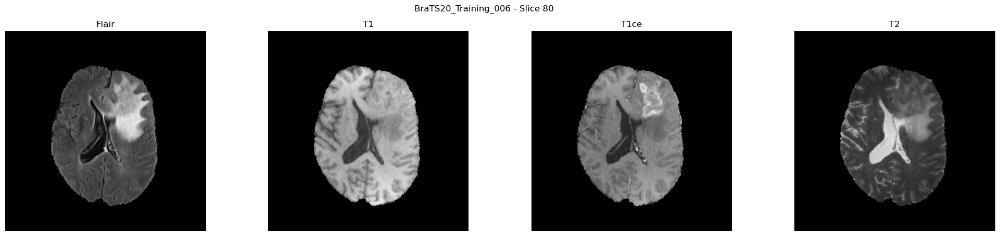

In [34]:
""" Visualize all modalities for a given subject in the BraTS test dataset"""

# Debug output
print("Test_Dataset geladen")
subject_id_testDS, image_tupel_testDS = dataset_testData[1]
print(image_tupel_testDS.shape)
print('Test Dataset: {} images'.format(len(dataset_testData)))

# Visualize all modalities for a given subject and slice

slice_idx = 80
sequences_testDS = ['Flair', 'T1', 'T1ce', 'T2']

fig, axs = plt.subplots(1, 4, figsize=(25, 5))
for i in range(4):
    slice_img = image_tupel_testDS[i, slice_idx, :, :].numpy()
    axs[i].imshow(slice_img, cmap='gray')
    axs[i].set_title(sequences_testDS[i])
    axs[i].axis('off')

plt.suptitle(f"{subject_id_testDS['subject_id']} - Slice {slice_idx}")
plt.show()

  0%|          | 0/14 [00:00<?, ?it/s]

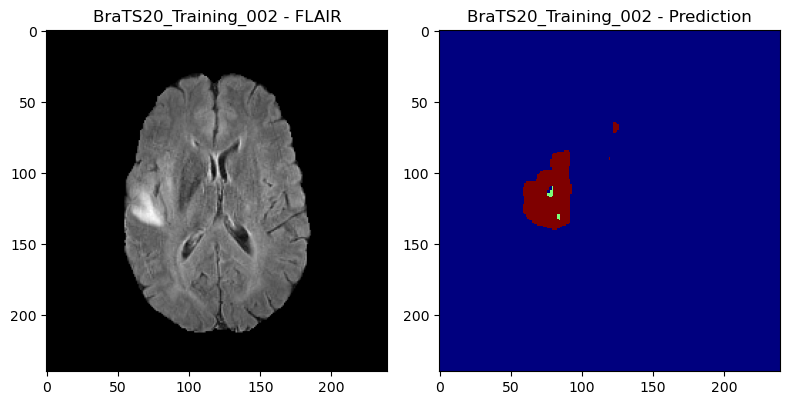

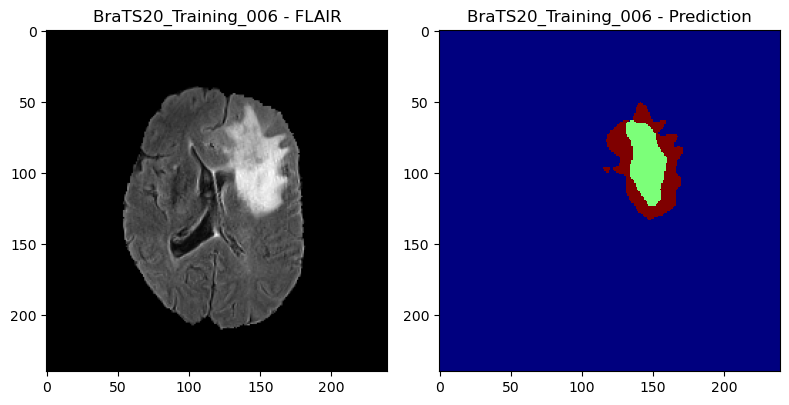

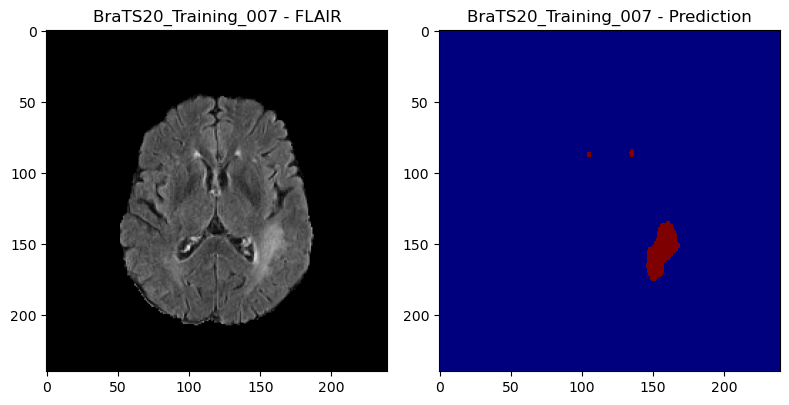

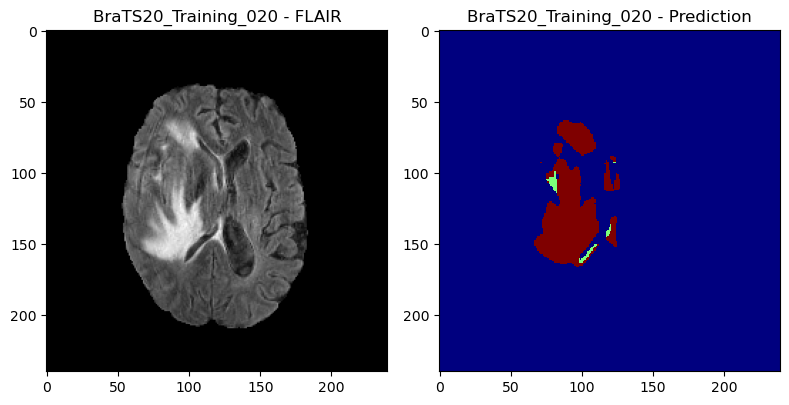

  7%|▋         | 1/14 [00:03<00:43,  3.36s/it]

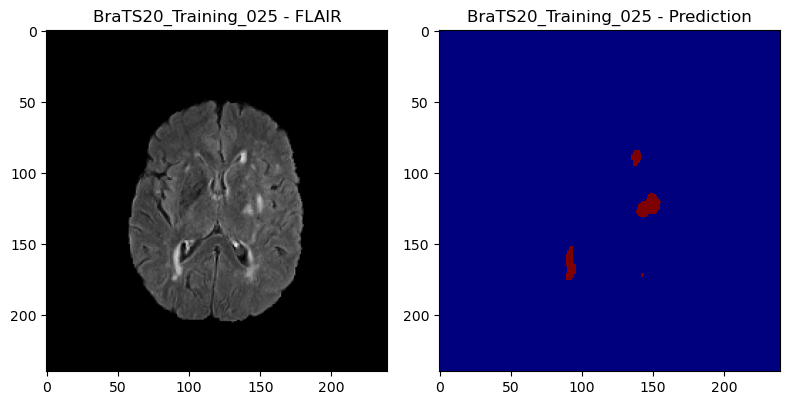

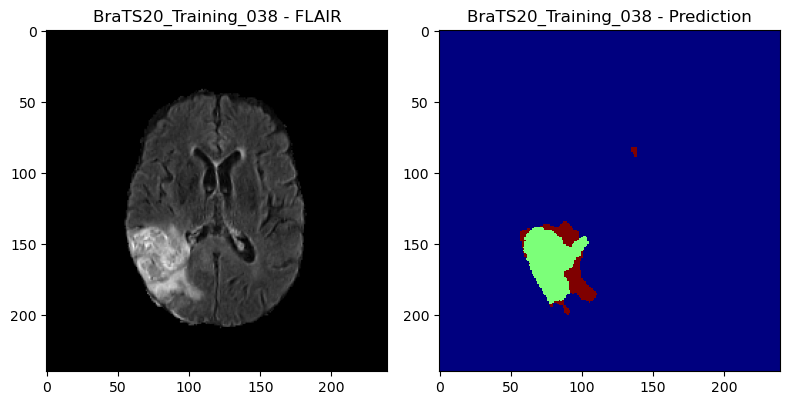

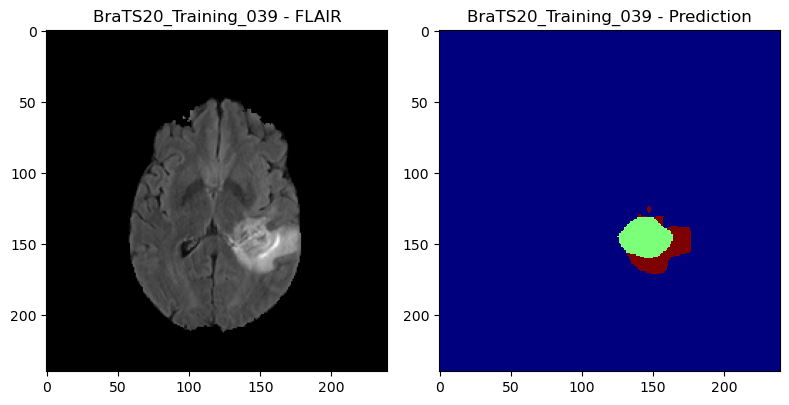

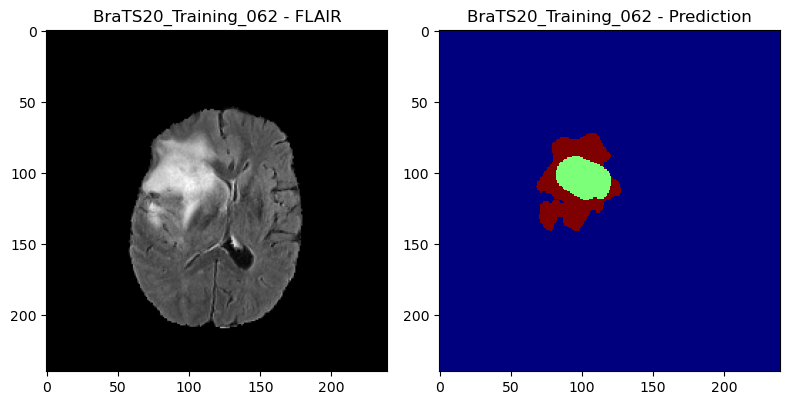

 14%|█▍        | 2/14 [00:06<00:40,  3.42s/it]

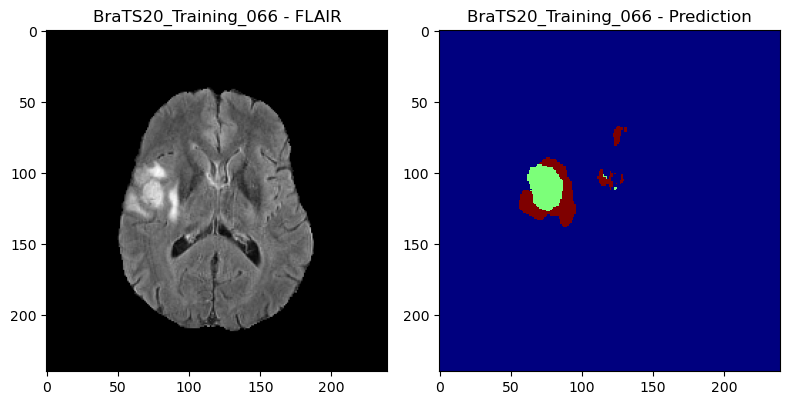

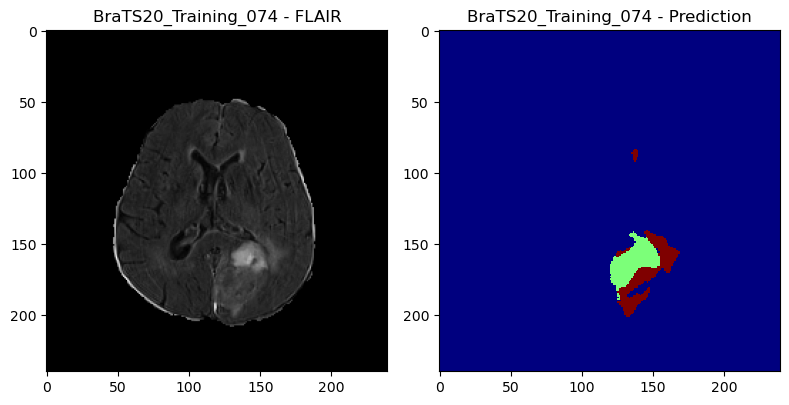

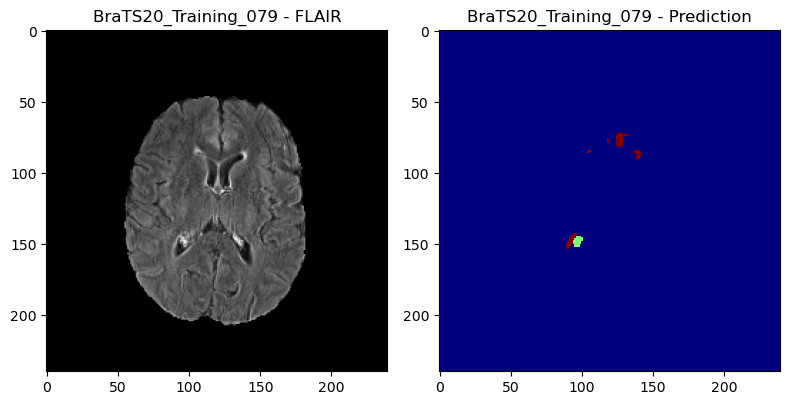

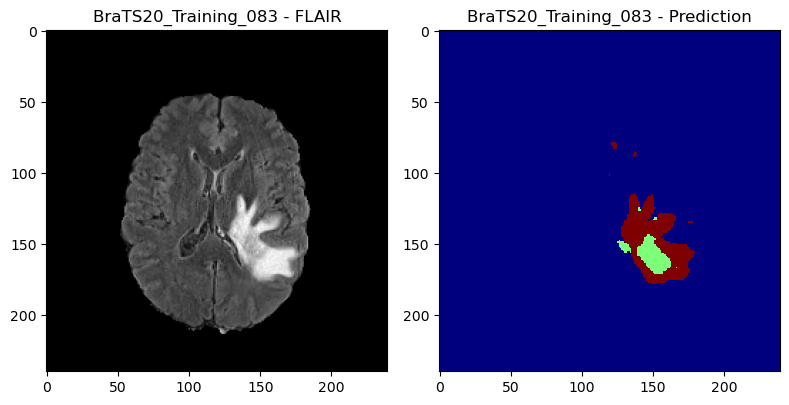

 21%|██▏       | 3/14 [00:08<00:31,  2.82s/it]

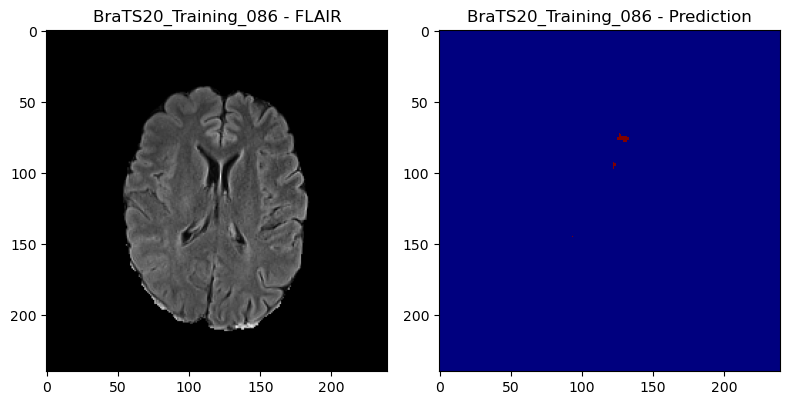

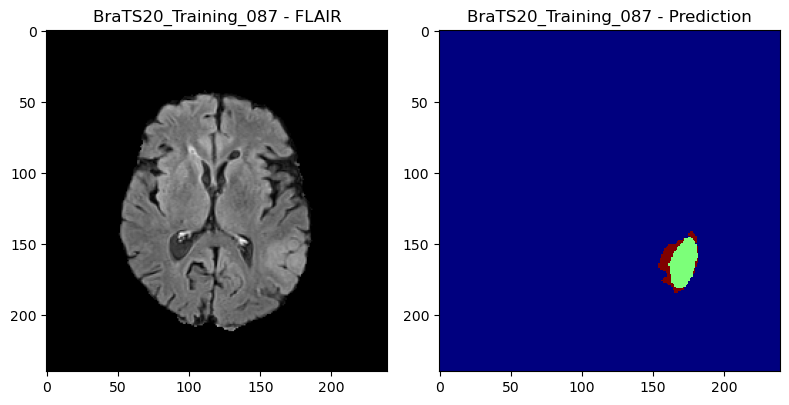

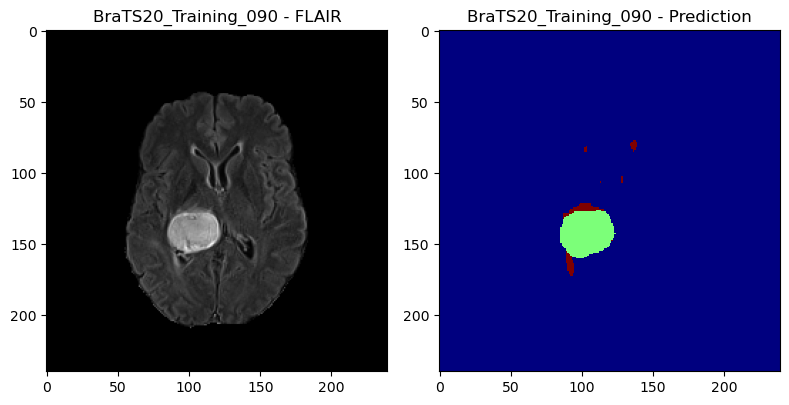

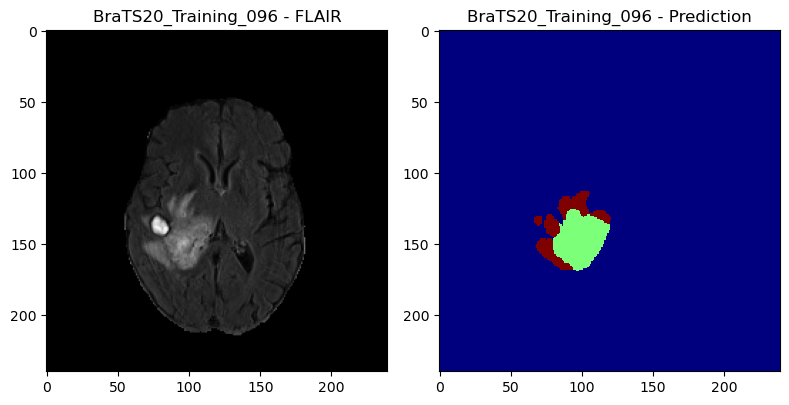

 29%|██▊       | 4/14 [00:10<00:25,  2.51s/it]

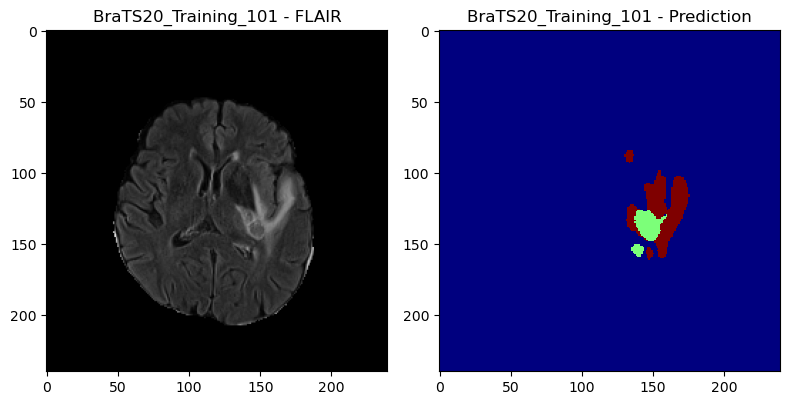

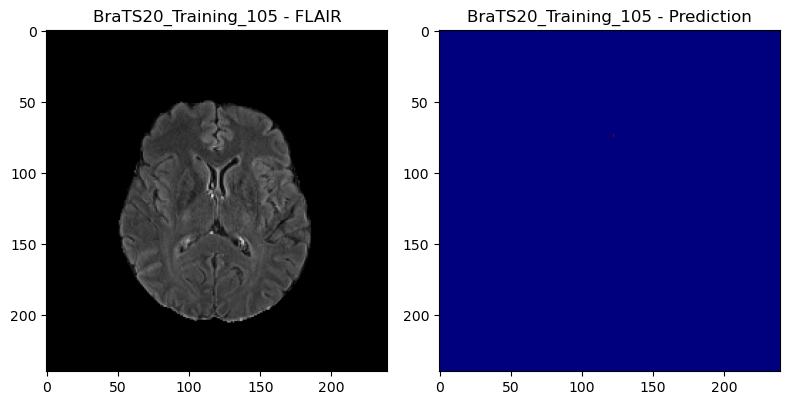

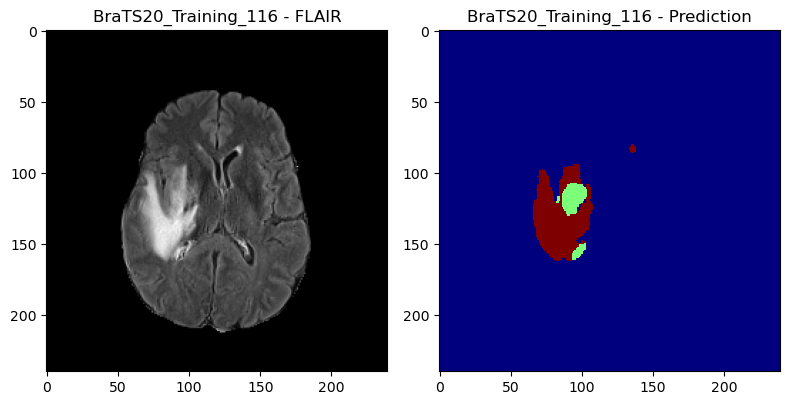

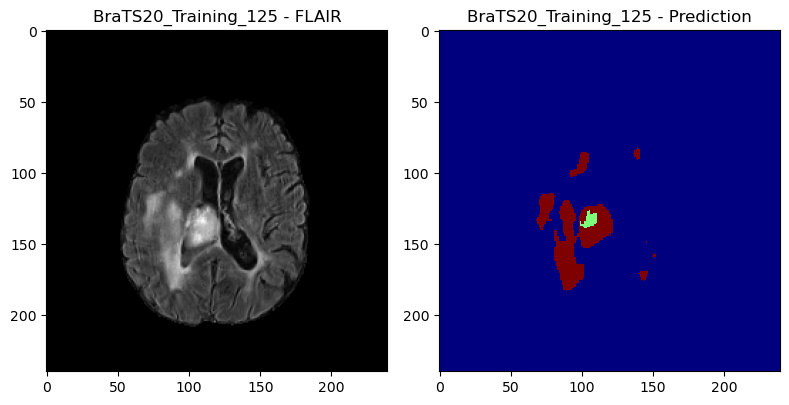

 36%|███▌      | 5/14 [00:12<00:20,  2.30s/it]

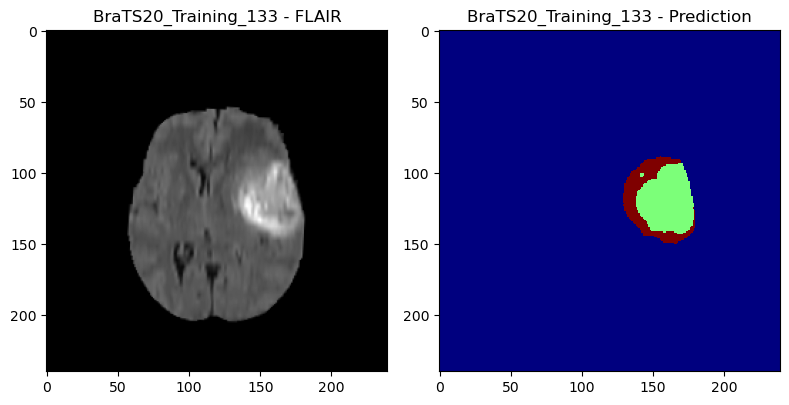

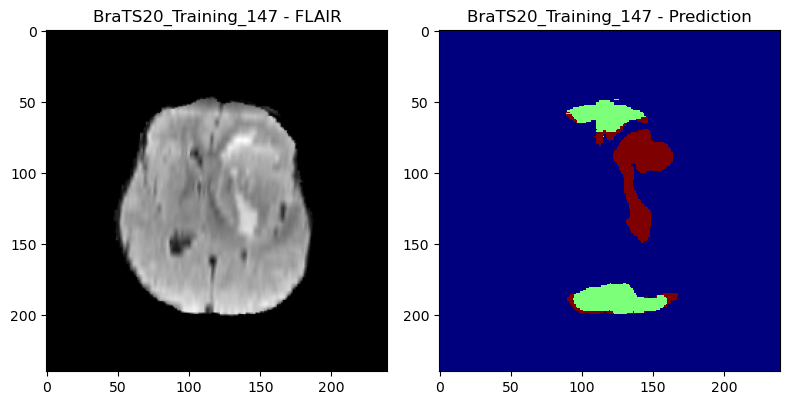

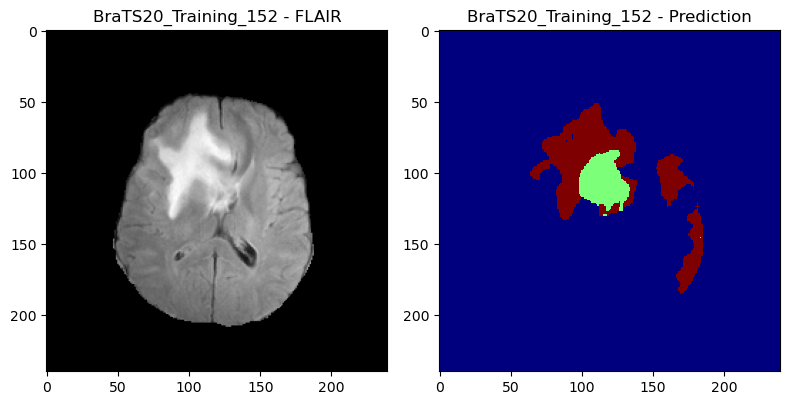

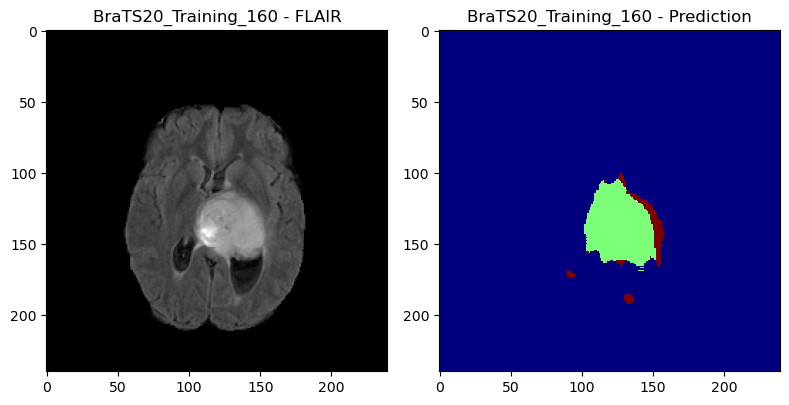

 43%|████▎     | 6/14 [00:14<00:17,  2.17s/it]

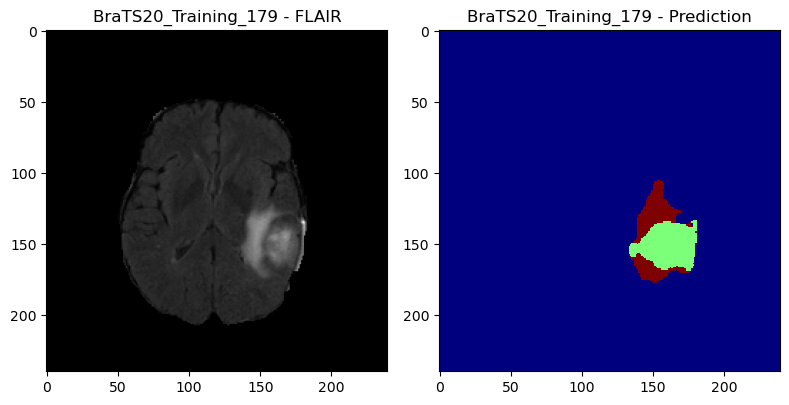

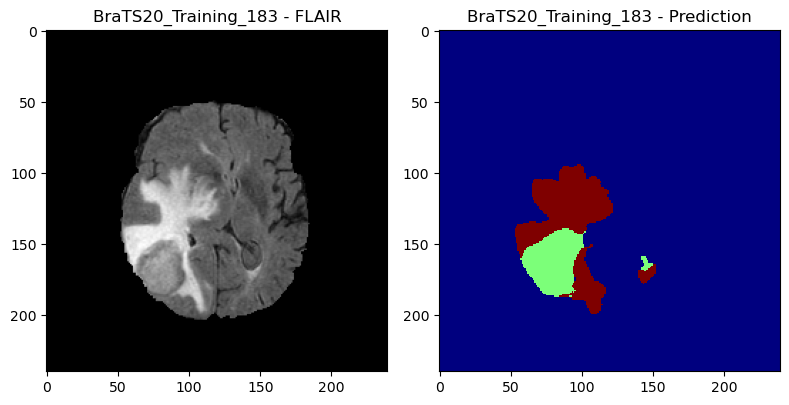

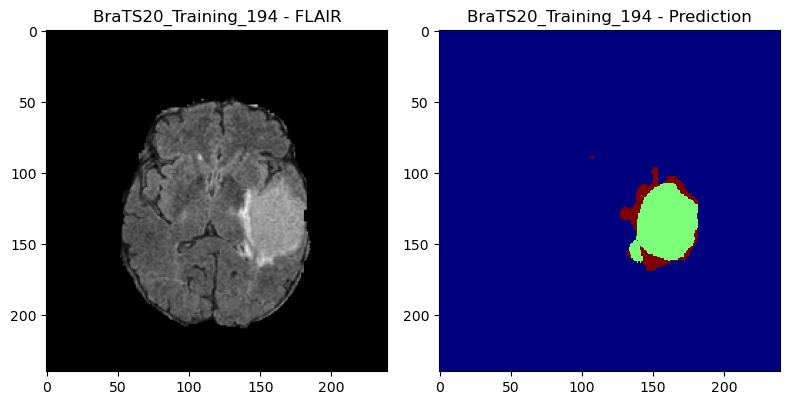

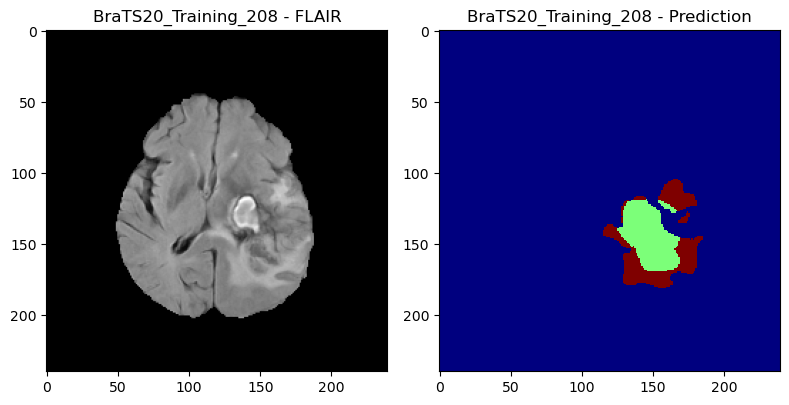

 50%|█████     | 7/14 [00:17<00:17,  2.49s/it]

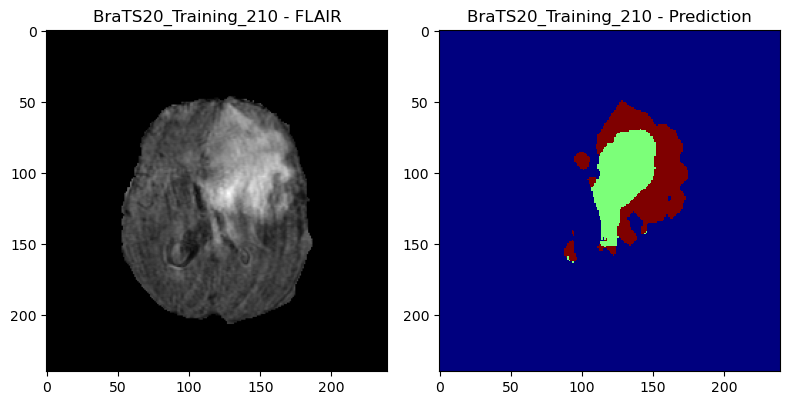

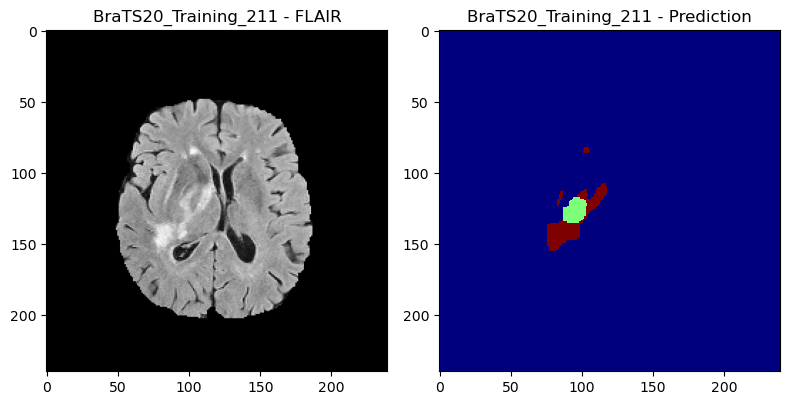

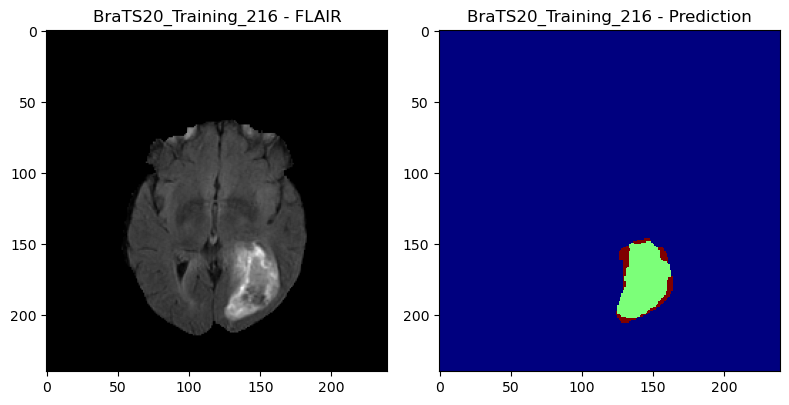

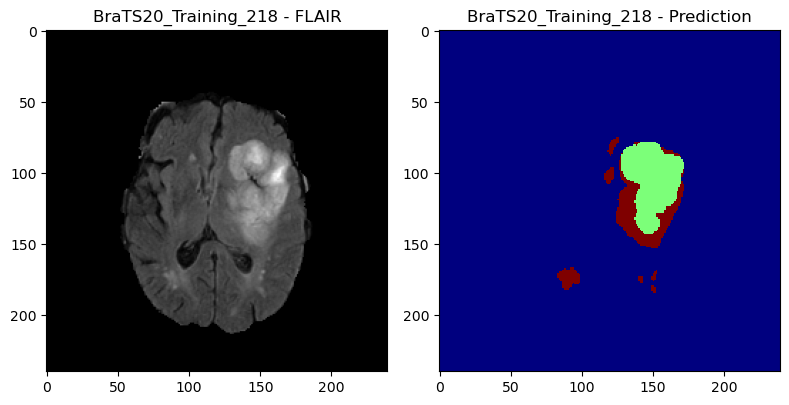

 57%|█████▋    | 8/14 [00:20<00:14,  2.50s/it]

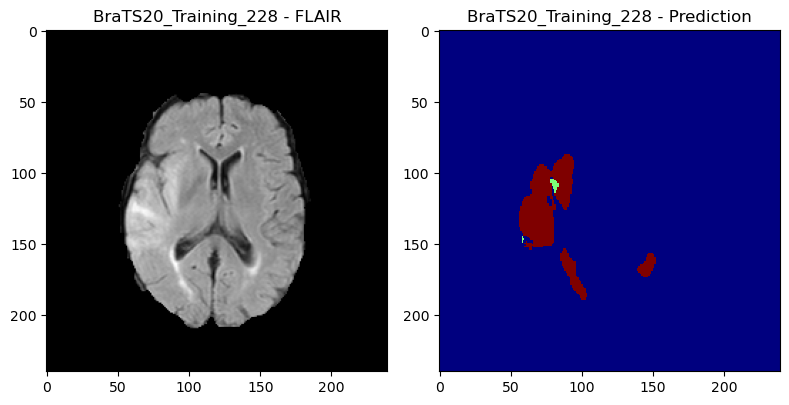

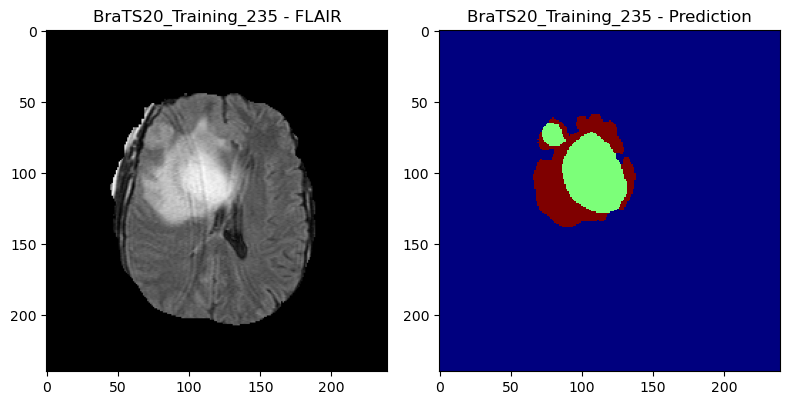

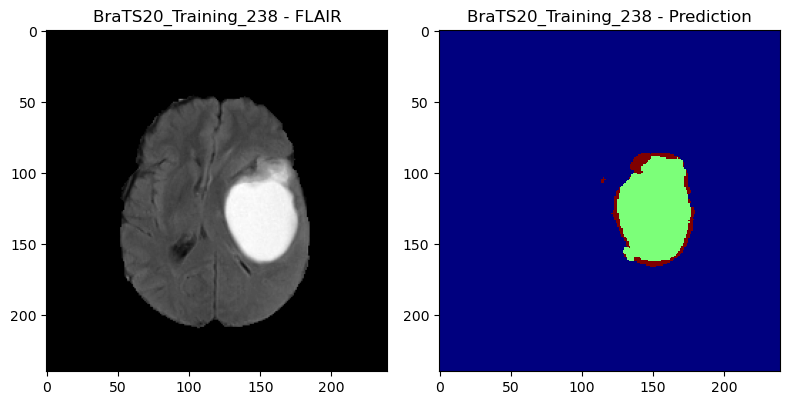

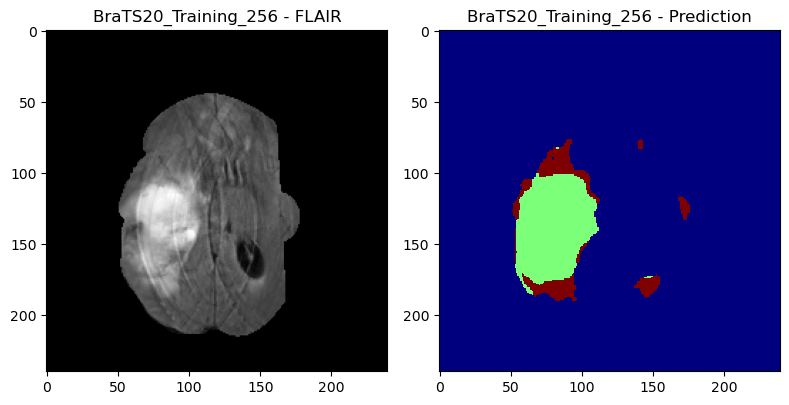

 64%|██████▍   | 9/14 [00:22<00:11,  2.34s/it]

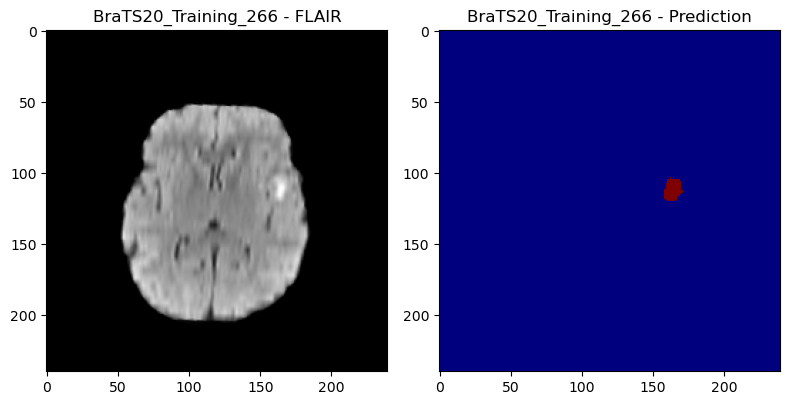

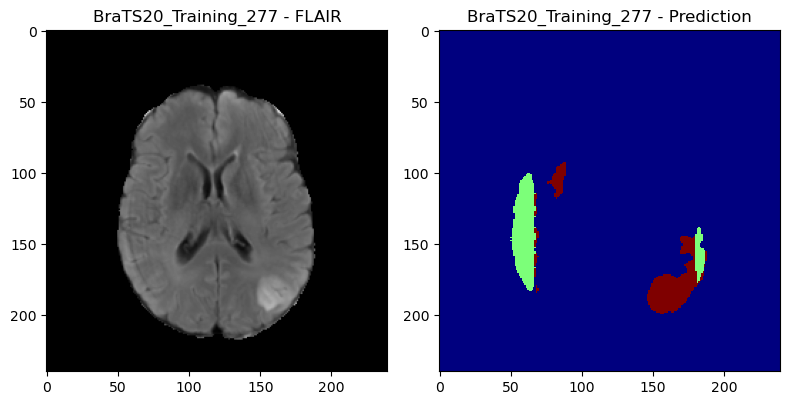

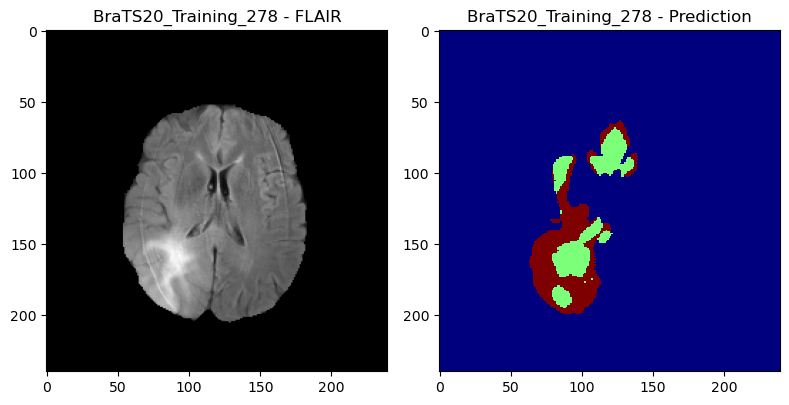

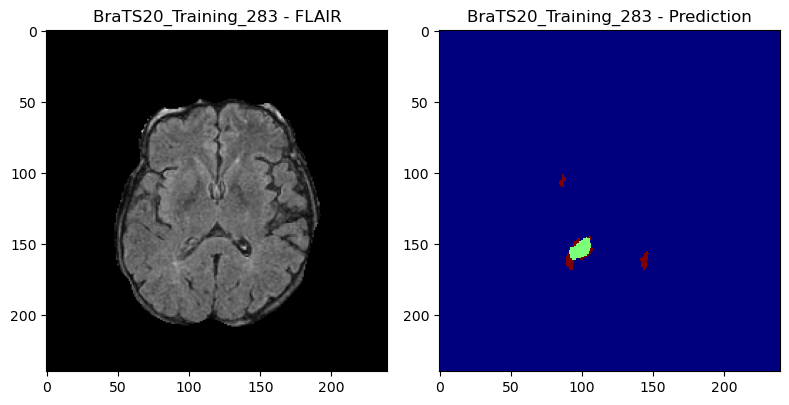

 71%|███████▏  | 10/14 [00:24<00:08,  2.23s/it]

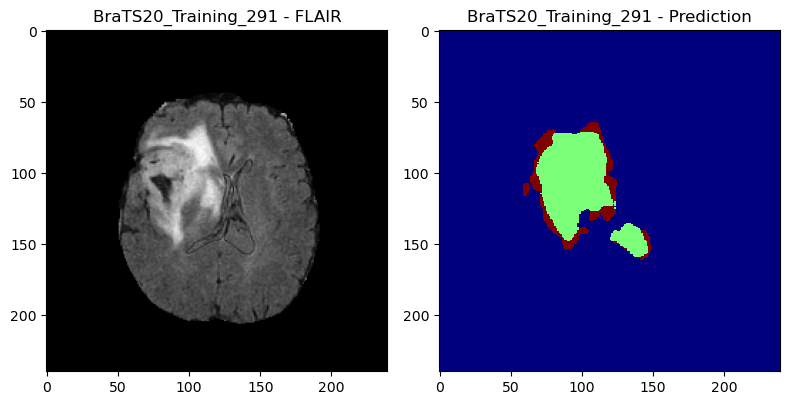

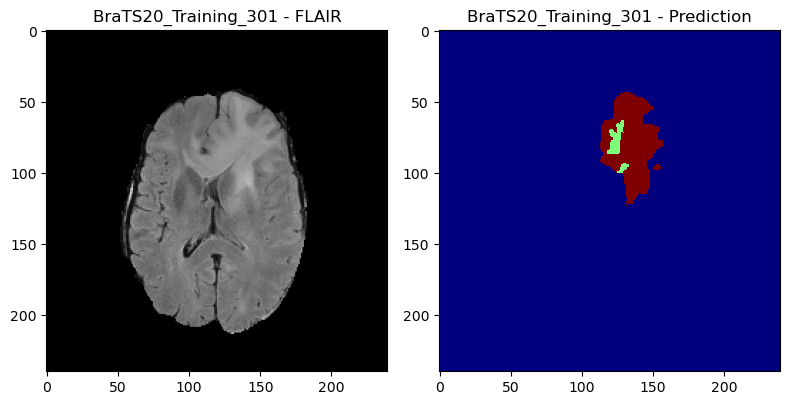

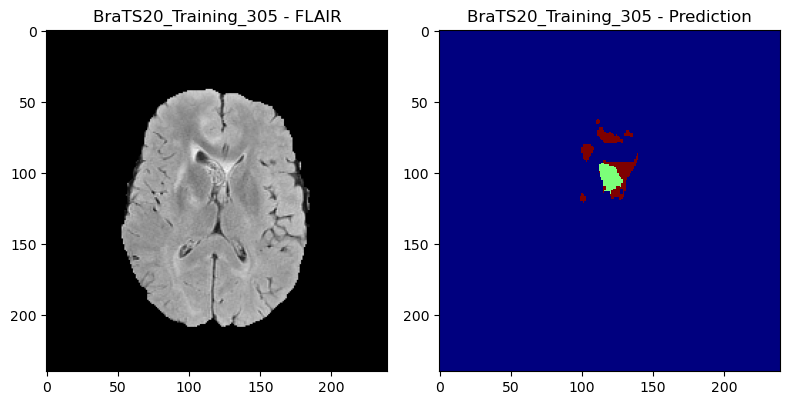

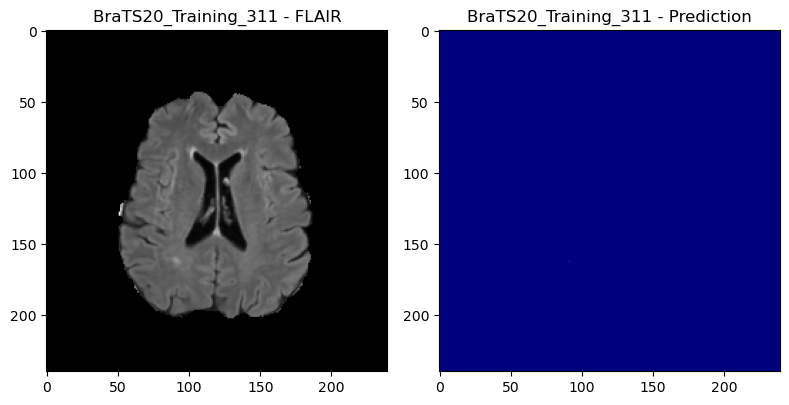

 79%|███████▊  | 11/14 [00:26<00:06,  2.17s/it]

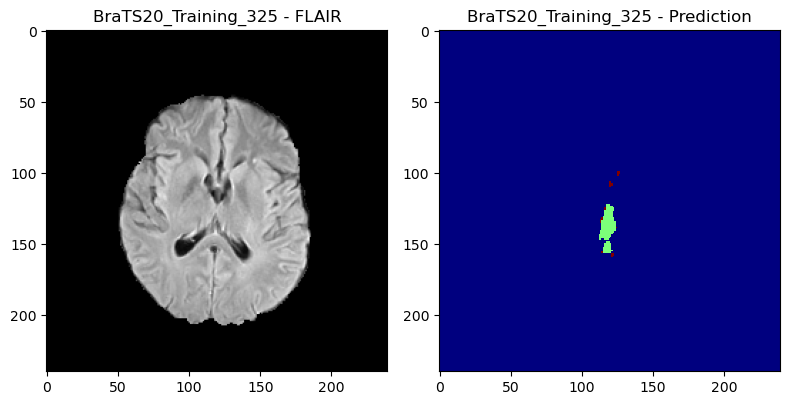

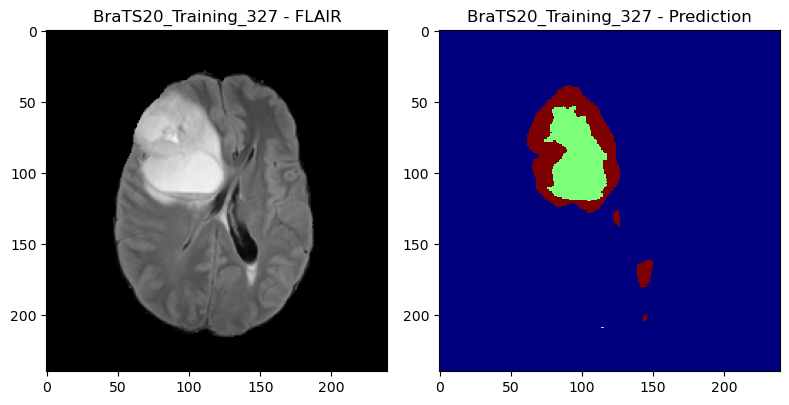

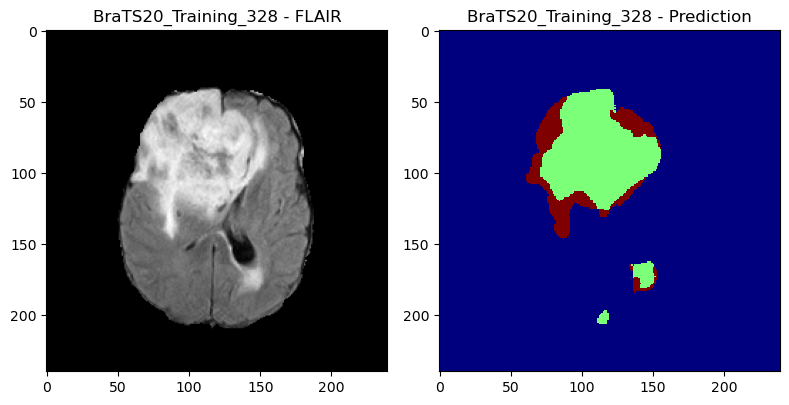

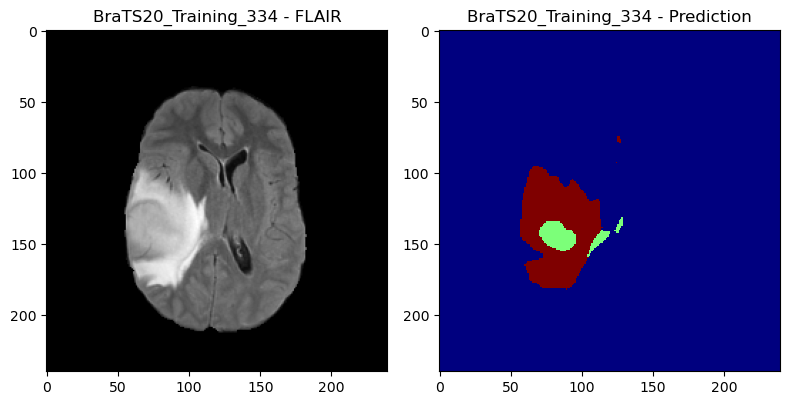

 86%|████████▌ | 12/14 [00:29<00:04,  2.30s/it]

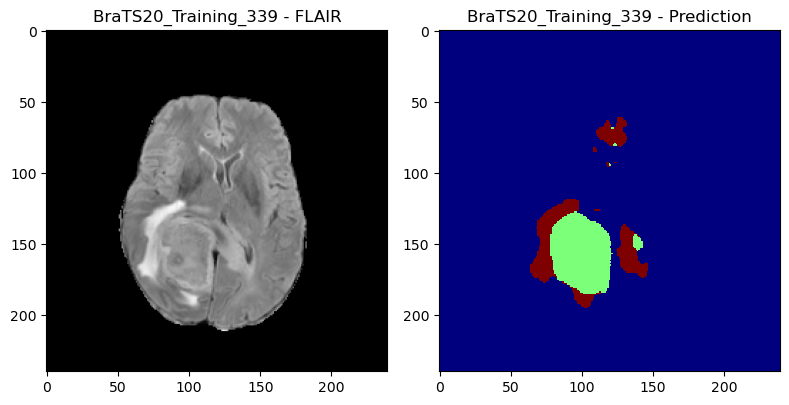

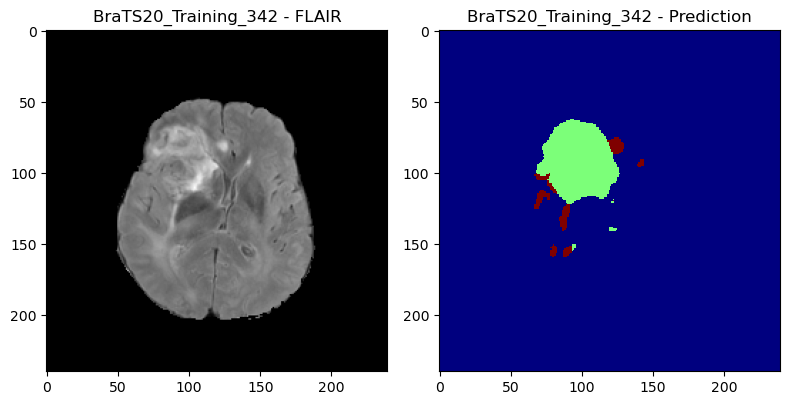

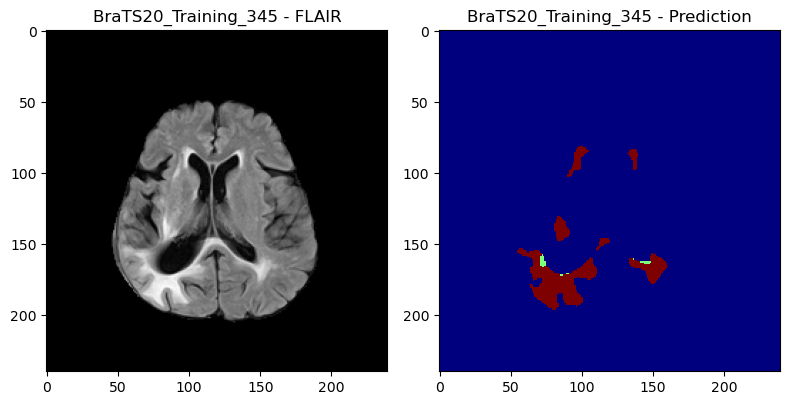

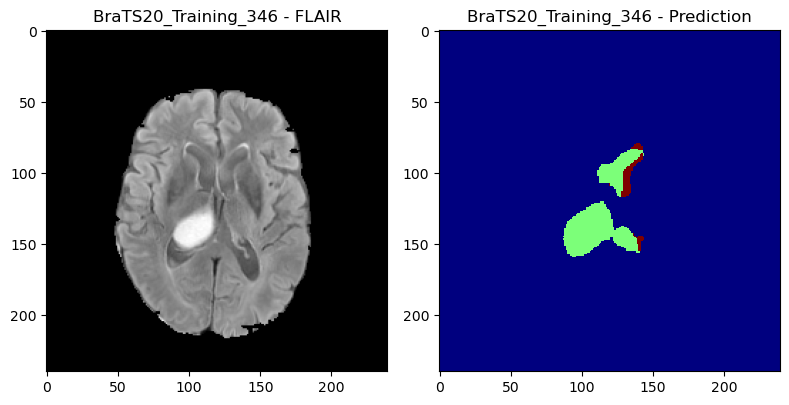

 93%|█████████▎| 13/14 [00:31<00:02,  2.40s/it]

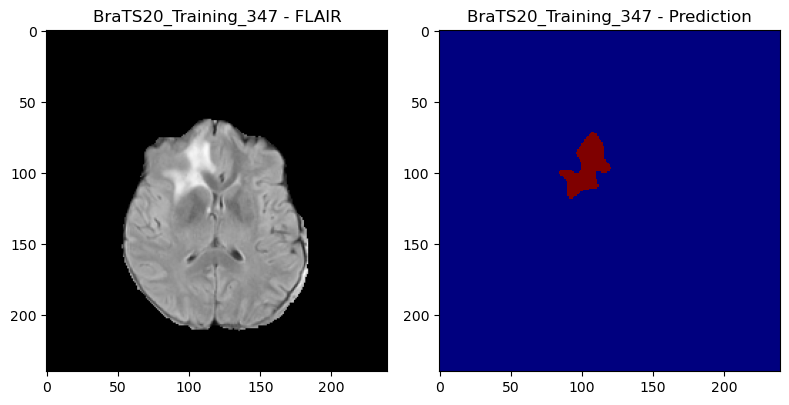

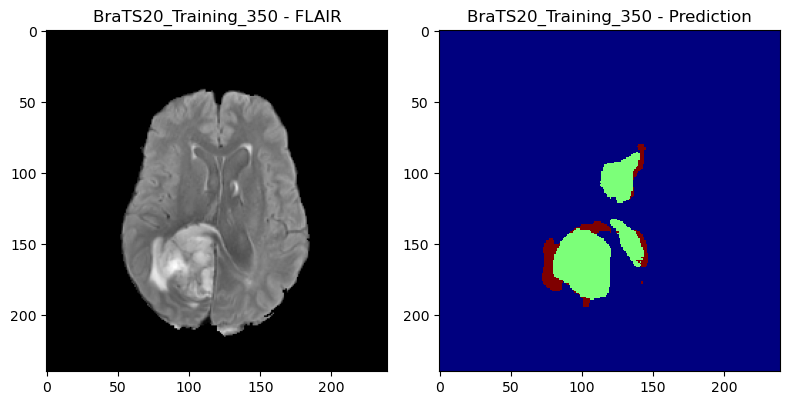

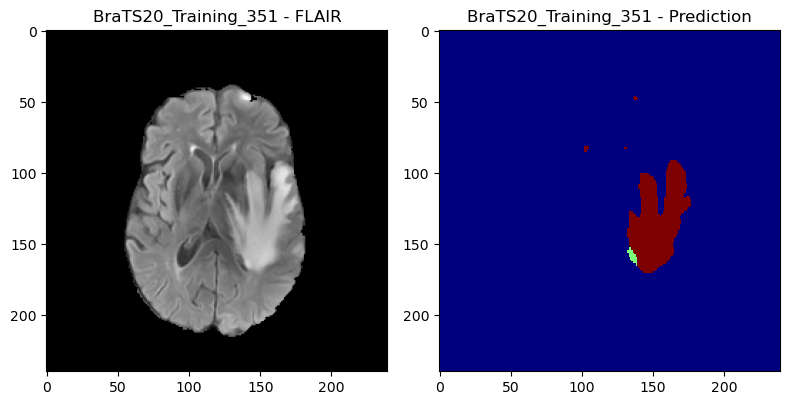

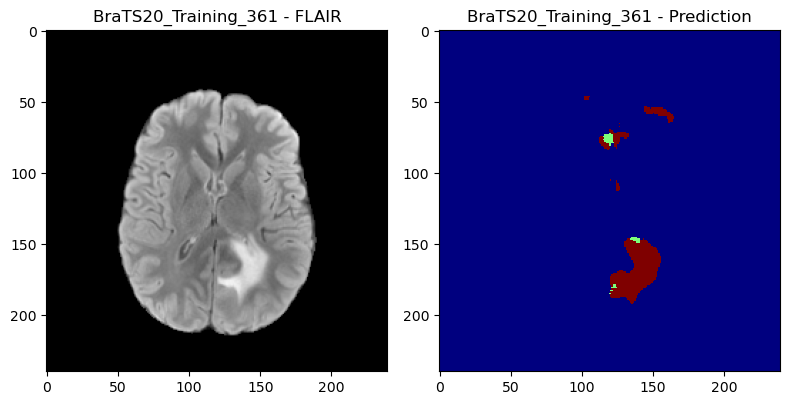

100%|██████████| 14/14 [00:34<00:00,  2.46s/it]


In [35]:
""" Run inference on the BraTS test dataset using the best trained model."""

# Parameters
RESULTDIR = 'Results/BraTS20_test'
DATADIR = '/home/shared/data/BraTS-torch-images-test/'
MODEL_PATH = 'best_model.pth'
BATCH_SIZE = 4
device = torch.device("cuda:1" if torch.cuda.is_available() else "cpu")

# Load Validation Dataset 
testDataset_loader = DataLoader(dataset_testData, batch_size=4, shuffle=False)

# Load Trained Model 
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.to(device)
model.eval()

# Create Output Directory
os.makedirs(RESULTDIR, exist_ok=True)

# Validation loop
with torch.no_grad():
    for val_idx, batch in enumerate(tqdm(testDataset_loader)):
        subject_dicts, images = batch
        images = images.to(device)

        # Perform inference
        outputs = model(images)
        predictions = torch.argmax(outputs, dim=1)  # Shape: [B, D, H, W]

        # Process each prediction in the batch
        for i in range(predictions.shape[0]):
            subject_id = subject_dicts['subject_id'][i] if isinstance(subject_dicts, dict) else subject_dicts[i]['subject_id']
            subject_id_padded = str(subject_id).zfill(3)

            # Convert prediction to numpy array and ensure correct dtype
            pred_i = predictions[i].cpu().numpy().astype(np.uint8)

            # Extract FLAIR image
            flair = images[i, 0].cpu().numpy()

            # Visualization
            slice_idx = pred_i.shape[0] // 2
            flair_slice = flair[slice_idx, :, :]
            pred_slice = pred_i[slice_idx, :, :]
            
            plt.figure(figsize=(8, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(flair_slice, cmap="gray")
            plt.title(f"{subject_id} - FLAIR")

            plt.subplot(1, 2, 2)
            plt.imshow(pred_slice, cmap='jet', interpolation='none')
            plt.title(f"{subject_id} - Prediction")

            plt.tight_layout()
            plt.show()
            
            # Save prediction
            pred_tensor = torch.from_numpy(pred_i).unsqueeze(0)  # Add channel dim: [1, D, H, W]
            
            save_prediction_bdhw(
                pred_tensor=pred_tensor,
                subject_id=subject_id_padded,
                RESULTDIR=RESULTDIR
            )


In [37]:
# Creating Zip file for submission to the BraTS challenge with the test data

create_zip(RESULTDIR='Results/BraTS20_test', idxes='test_torch')

####
Creating submission file for test_torch cases
####
